# Problem Definition

<div class="alert alert-block alert-info">
PowerCo is a major gas and electricity utility that supplies to corporate, SME (Small & Medium Enterprise), and residential customers. The power-liberalization of the energy market in Europe has led to significant customer churn, especially in the SME segment.
<br>
<br>
A fair hypothesis is that price changes affect customer churn. Therefore, it is helpful to know which customers are more (or less) likely to churn at their current price, for which a good predictive model could be useful.
<br>
<br>
Moreover, for those customers that are at risk of churning, a discount might incentivize them to stay with our client. The head of the SME division is considering a 20% discount that is considered large enough to dissuade almost anyone from churning (especially those for whom price is the primary concern)

</div>

<div class="alert alert-block alert-success">
    This problem is mainly a data science prediction problem. Through analyzing the data(<b>The client data and the Prices data</b>), understanding deeper insights it holds and modelling this data will enable us to build a classification model able to predict whether the customer is likely to churn.
Our approach will be following the crisp DM model beginning with understanding the business, understanding the data, preparing the data for modelling, building our model then evaluating it and giving the final report.
</div>

# Business Understanding

Let us begin with The features description in both of the datasets we will be working on in this project

### Client Data Features Description

●	id = client company identifier
<br>
●	activity_new = category of the company’s activity
<br>
●	channel_sales = code of the sales channel
<br>
●	cons_12m = electricity consumption of the past 12 months
<br>
●	cons_gas_12m = gas consumption of the past 12 months
<br>
●	cons_last_month = electricity consumption of the last month
<br>
●	date_activ = date of activation of the contract
<br>
●	date_end = registered date of the end of the contract
<br>
●	date_modif_prod = date of the last modification of the product
<br>
●	date_renewal = date of the next contract renewal
<br>
●	forecast_cons_12m = forecasted electricity consumption for next 12 months
<br>
●	forecast_cons_year = forecasted electricity consumption for the next calendar year
<br>
●	forecast_discount_energy = forecasted value of current discount
<br>
●	forecast_meter_rent_12m = forecasted bill of meter rental for the next 2 months
<br>
●	forecast_price_energy_off_peak = forecasted energy price for 1st period (off peak)
<br>
●	forecast_price_energy_peak = forecasted energy price for 2nd period (peak)
<br>
●	forecast_price_pow_off_peak = forecasted power price for 1st period (off peak)
<br>
●	has_gas = indicated if client is also a gas client<br>
●	imp_cons = current paid consumption<br>
●	margin_gross_pow_ele = gross margin on power subscription<br>
●	margin_net_pow_ele = net margin on power subscription<br>
●	nb_prod_act = number of active products and services<br>
●	net_margin = total net margin<br>
●	num_years_antig = antiquity of the client (in number of years)<br>
●	origin_up = code of the electricity campaign the customer first subscribed to<br>
●	pow_max = subscribed power<br>
●	churn = has the client churned over the next 3 months<br>


### Prices Data Features Description

●	id = client company identifier<br>
●	price_date = reference date<br>
●	price_off_peak_var = price of energy for the 1st period (off peak)<br>
●	price_peak_var = price of energy for the 2nd period (peak)<br>
●	price_mid_peak_var = price of energy for the 3rd period (mid peak)<br>
●	price_off_peak_fix = price of power for the 1st period (off peak)<br>
●	price_peak_fix = price of power for the 2nd period (peak)<br>
●	price_mid_peak_fix = price of power for the 3rd period (mid peak)<br>


## Exploratory Data Analysis

In [345]:
import pandas as pd
import seaborn as sns
import plotly.express as px
import matplotlib.pyplot as plt
import numpy as np
import warnings
from catboost import CatBoostClassifier, Pool
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, r2_score, roc_auc_score, roc_curve, confusion_matrix, plot_confusion_matrix
warnings.filterwarnings('ignore')
import missingno as msno
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import confusion_matrix
from xgboost import XGBClassifier
import lightgbm as lgb
from sklearn.svm import SVC
from sklearn.linear_model import LogisticRegression, SGDClassifier

In [2]:
import plotly.io as pio
import plotly.express as px

pio.templates.default = "plotly"

In [3]:
pd.set_option('display.max_columns',None)

Let's import our datasets

In [4]:
dfc = pd.read_csv("client_data.csv")
dfp = pd.read_csv("price_data.csv")

### StatisticalOverview

In [5]:
dfc.head(50)

,id,channel_sales,cons_12m,cons_gas_12m,cons_last_month,date_activ,date_end,date_modif_prod,date_renewal,forecast_cons_12m,forecast_cons_year,forecast_discount_energy,forecast_meter_rent_12m,forecast_price_energy_off_peak,forecast_price_energy_peak,forecast_price_pow_off_peak,has_gas,imp_cons,margin_gross_pow_ele,margin_net_pow_ele,nb_prod_act,net_margin,num_years_antig,origin_up,pow_max,churn
0,24011ae4ebbe3035111d65fa7c15bc57,foosdfpfkusacimwkcsosbicdxkicaua,0,54946,0,2013-06-15,2016-06-15,2015-11-01,2015-06-23,0.00,0,0.0,1.78,0.114481,0.098142,40.606701,t,0.00,25.44,25.44,2,678.99,3,lxidpiddsbxsbosboudacockeimpuepw,43.648,1
1,d29c2c54acc38ff3c0614d0a653813dd,MISSING,4660,0,0,2009-08-21,2016-08-30,2009-08-21,2015-08-31,189.95,0,0.0,16.27,0.145711,0.000000,44.311378,f,0.00,16.38,16.38,1,18.89,6,kamkkxfxxuwbdslkwifmmcsiusiuosws,13.800,0
2,764c75f661154dac3a6c254cd082ea7d,foosdfpfkusacimwkcsosbicdxkicaua,544,0,0,2010-04-16,2016-04-16,2010-04-16,2015-04-17,47.96,0,0.0,38.72,0.165794,0.087899,44.311378,f,0.00,28.60,28.60,1,6.60,6,kamkkxfxxuwbdslkwifmmcsiusiuosws,13.856,0
3,bba03439a292a1e166f80264c16191cb,lmkebamcaaclubfxadlmueccxoimlema,1584,0,0,2010-03-30,2016-03-30,2010-03-30,2015-03-31,240.04,0,0.0,19.83,0.146694,0.000000,44.311378,f,0.00,30.22,30.22,1,25.46,6,kamkkxfxxuwbdslkwifmmcsiusiuosws,13.200,0
4,149d57cf92fc41cf94415803a877cb4b,MISSING,4425,0,526,2010-01-13,2016-03-07,2010-01-13,2015-03-09,445.75,526,0.0,131.73,0.116900,0.100015,40.606701,f,52.32,44.91,44.91,1,47.98,6,kamkkxfxxuwbdslkwifmmcsiusiuosws,19.800,0
5,1aa498825382410b098937d65c4ec26d,usilxuppasemubllopkaafesmlibmsdf,8302,0,1998,2011-12-09,2016-12-09,2015-11-01,2015-12-10,796.94,1998,0.0,30.12,0.164775,0.086131,45.308378,f,181.21,33.12,33.12,1,118.89,4,lxidpiddsbxsbosboudacockeimpuepw,13.200,1
6,7ab4bf4878d8f7661dfc20e9b8e18011,foosdfpfkusacimwkcsosbicdxkicaua,45097,0,0,2011-12-02,2016-12-02,2011-12-02,2015-12-03,8069.28,0,0.0,0.00,0.166178,0.087538,44.311378,f,0.00,4.04,4.04,1,346.63,4,lxidpiddsbxsbosboudacockeimpuepw,15.000,1
7,01495c955be7ec5e7f3203406785aae0,foosdfpfkusacimwkcsosbicdxkicaua,29552,0,1260,2010-04-21,2016-04-21,2010-04-21,2015-04-22,864.73,751,0.0,144.49,0.115174,0.098837,40.606701,f,70.63,53.92,53.92,1,100.09,6,lxidpiddsbxsbosboudacockeimpuepw,26.400,0
8,f53a254b1115634330c12c7fdbf7958a,usilxuppasemubllopkaafesmlibmsdf,2962,0,0,2011-09-23,2016-09-23,2011-09-23,2015-09-25,444.38,0,0.0,15.85,0.145711,0.000000,44.311378,f,0.00,12.82,12.82,1,42.59,4,kamkkxfxxuwbdslkwifmmcsiusiuosws,13.200,0
9,10c1b2f97a2d2a6f10299dc213d1a370,lmkebamcaaclubfxadlmueccxoimlema,26064,0,2188,2010-05-04,2016-05-04,2015-04-29,2015-05-05,2738.10,2188,0.0,130.43,0.115761,0.099419,40.606701,f,219.59,33.42,33.42,1,329.60,6,lxidpiddsbxsbosboudacockeimpuepw,31.500,0


In [6]:
dfp.head()

,id,price_date,price_off_peak_var,price_peak_var,price_mid_peak_var,price_off_peak_fix,price_peak_fix,price_mid_peak_fix
0,038af19179925da21a25619c5a24b745,2015-01-01,0.151367,0.0,0.0,44.266931,0.0,0.0
1,038af19179925da21a25619c5a24b745,2015-02-01,0.151367,0.0,0.0,44.266931,0.0,0.0
2,038af19179925da21a25619c5a24b745,2015-03-01,0.151367,0.0,0.0,44.266931,0.0,0.0
3,038af19179925da21a25619c5a24b745,2015-04-01,0.149626,0.0,0.0,44.266931,0.0,0.0
4,038af19179925da21a25619c5a24b745,2015-05-01,0.149626,0.0,0.0,44.266931,0.0,0.0


In [7]:
dfc.shape

(14606, 26)

In [8]:
dfp.shape

(193002, 8)

Our clients dataset has 14606 rows and 26 features whereas our prices dataset has 193002 rows and 8 features

In [9]:
dfc.duplicated(['id']).sum()

0

In [10]:
dfp.duplicated(["id"]).sum()

176906

In [11]:
len(dfc['id'].unique())

14606

In [12]:
len(dfp['id'].unique())

16096

In [13]:
dfc.describe()

,cons_12m,cons_gas_12m,cons_last_month,forecast_cons_12m,forecast_cons_year,forecast_discount_energy,forecast_meter_rent_12m,forecast_price_energy_off_peak,forecast_price_energy_peak,forecast_price_pow_off_peak,imp_cons,margin_gross_pow_ele,margin_net_pow_ele,nb_prod_act,net_margin,num_years_antig,pow_max,churn
count,1.460600e+04,1.460600e+04,14606.000000,14606.000000,14606.000000,14606.000000,14606.000000,14606.000000,14606.000000,14606.000000,14606.000000,14606.000000,14606.000000,14606.000000,14606.000000,14606.000000,14606.000000,14606.000000
mean,1.592203e+05,2.809238e+04,16090.269752,1868.614880,1399.762906,0.966726,63.086871,0.137283,0.050491,43.130056,152.786896,24.565121,24.562517,1.292346,189.264522,4.997809,18.135136,0.097152
std,5.734653e+05,1.629731e+05,64364.196422,2387.571531,3247.786255,5.108289,66.165783,0.024623,0.049037,4.485988,341.369366,20.231172,20.230280,0.709774,311.798130,1.611749,13.534743,0.296175
min,0.000000e+00,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,1.000000,3.300000,0.000000
25%,5.674750e+03,0.000000e+00,0.000000,494.995000,0.000000,0.000000,16.180000,0.116340,0.000000,40.606701,0.000000,14.280000,14.280000,1.000000,50.712500,4.000000,12.500000,0.000000
50%,1.411550e+04,0.000000e+00,792.500000,1112.875000,314.000000,0.000000,18.795000,0.143166,0.084138,44.311378,37.395000,21.640000,21.640000,1.000000,112.530000,5.000000,13.856000,0.000000
75%,4.076375e+04,0.000000e+00,3383.000000,2401.790000,1745.750000,0.000000,131.030000,0.146348,0.098837,44.311378,193.980000,29.880000,29.880000,1.000000,243.097500,6.000000,19.172500,0.000000
max,6.207104e+06,4.154590e+06,771203.000000,82902.830000,175375.000000,30.000000,599.310000,0.273963,0.195975,59.266378,15042.790000,374.640000,374.640000,32.000000,24570.650000,13.000000,320.000000,1.000000


In [14]:
dfp.describe()

,price_off_peak_var,price_peak_var,price_mid_peak_var,price_off_peak_fix,price_peak_fix,price_mid_peak_fix
count,193002.000000,193002.000000,193002.000000,193002.000000,193002.000000,193002.000000
mean,0.141027,0.054630,0.030496,43.334477,10.622875,6.409984
std,0.025032,0.049924,0.036298,5.410297,12.841895,7.773592
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.125976,0.000000,0.000000,40.728885,0.000000,0.000000
50%,0.146033,0.085483,0.000000,44.266930,0.000000,0.000000
75%,0.151635,0.101673,0.072558,44.444710,24.339581,16.226389
max,0.280700,0.229788,0.114102,59.444710,36.490692,17.458221


### Data Types

In [15]:
dfc.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14606 entries, 0 to 14605
Data columns (total 26 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   id                              14606 non-null  object 
 1   channel_sales                   14606 non-null  object 
 2   cons_12m                        14606 non-null  int64  
 3   cons_gas_12m                    14606 non-null  int64  
 4   cons_last_month                 14606 non-null  int64  
 5   date_activ                      14606 non-null  object 
 6   date_end                        14606 non-null  object 
 7   date_modif_prod                 14606 non-null  object 
 8   date_renewal                    14606 non-null  object 
 9   forecast_cons_12m               14606 non-null  float64
 10  forecast_cons_year              14606 non-null  int64  
 11  forecast_discount_energy        14606 non-null  float64
 12  forecast_meter_rent_12m         

In [16]:
dfp.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 193002 entries, 0 to 193001
Data columns (total 8 columns):
 #   Column              Non-Null Count   Dtype  
---  ------              --------------   -----  
 0   id                  193002 non-null  object 
 1   price_date          193002 non-null  object 
 2   price_off_peak_var  193002 non-null  float64
 3   price_peak_var      193002 non-null  float64
 4   price_mid_peak_var  193002 non-null  float64
 5   price_off_peak_fix  193002 non-null  float64
 6   price_peak_fix      193002 non-null  float64
 7   price_mid_peak_fix  193002 non-null  float64
dtypes: float64(6), object(2)
memory usage: 11.8+ MB


we notice that we have ids of companies in the prices dataset not present in the clients dataset. we will work on this later on

### Missing Values

<AxesSubplot:>

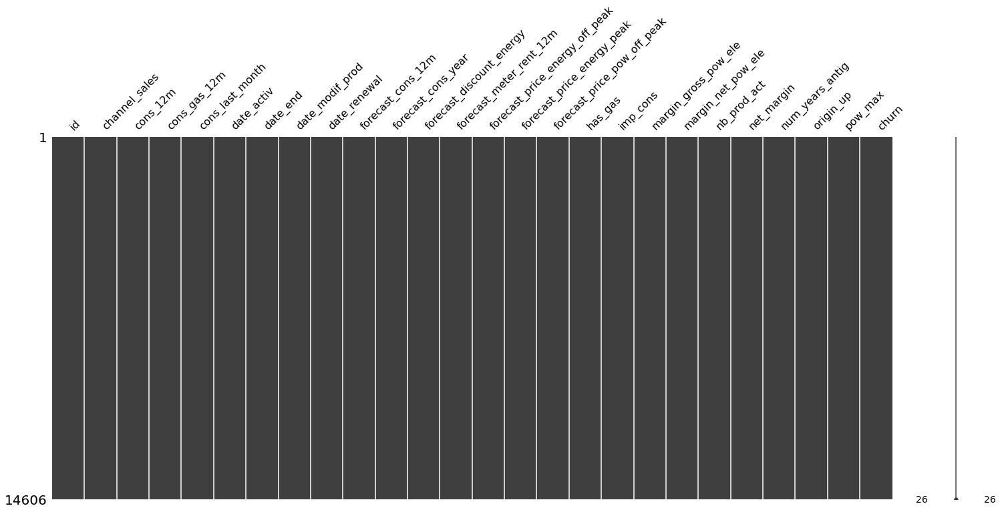

In [17]:
msno.matrix(dfc)

<AxesSubplot:>

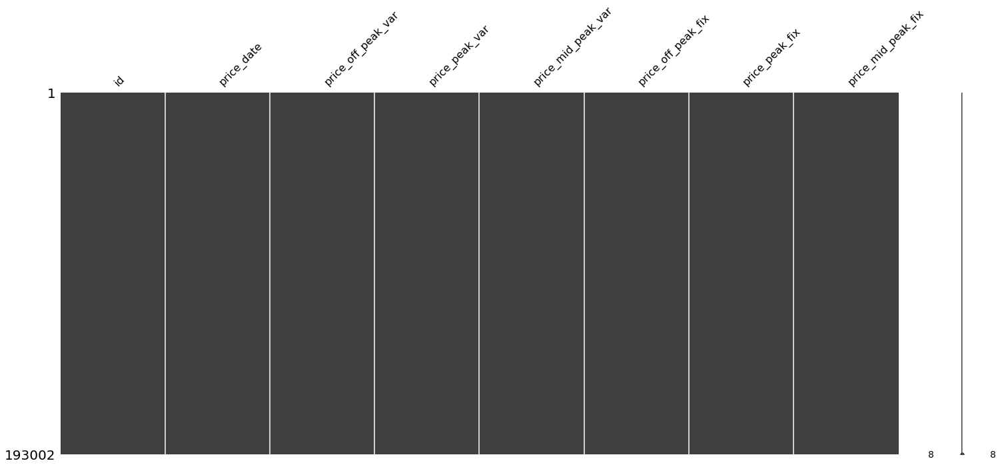

In [18]:
msno.matrix(dfp)

In [19]:
res = dfc.isin(['MISSING']).any().any()
if res:
    print("there are missing values in our dataset")
else:
    print("there are no missning values in our dataset")

there are missing values in our dataset


In [20]:
res = dfc.isin(['MISSING']).any()

In [21]:
res

id                                False
channel_sales                      True
cons_12m                          False
cons_gas_12m                      False
cons_last_month                   False
date_activ                        False
date_end                          False
date_modif_prod                   False
date_renewal                      False
forecast_cons_12m                 False
forecast_cons_year                False
forecast_discount_energy          False
forecast_meter_rent_12m           False
forecast_price_energy_off_peak    False
forecast_price_energy_peak        False
forecast_price_pow_off_peak       False
has_gas                           False
imp_cons                          False
margin_gross_pow_ele              False
margin_net_pow_ele                False
nb_prod_act                       False
net_margin                        False
num_years_antig                   False
origin_up                          True
pow_max                           False


In [22]:
dfc[dfc['channel_sales']=='MISSING']

,id,channel_sales,cons_12m,cons_gas_12m,cons_last_month,date_activ,date_end,date_modif_prod,date_renewal,forecast_cons_12m,forecast_cons_year,forecast_discount_energy,forecast_meter_rent_12m,forecast_price_energy_off_peak,forecast_price_energy_peak,forecast_price_pow_off_peak,has_gas,imp_cons,margin_gross_pow_ele,margin_net_pow_ele,nb_prod_act,net_margin,num_years_antig,origin_up,pow_max,churn
1,d29c2c54acc38ff3c0614d0a653813dd,MISSING,4660,0,0,2009-08-21,2016-08-30,2009-08-21,2015-08-31,189.95,0,0.0,16.27,0.145711,0.000000,44.311378,f,0.00,16.38,16.38,1,18.89,6,kamkkxfxxuwbdslkwifmmcsiusiuosws,13.800,0
4,149d57cf92fc41cf94415803a877cb4b,MISSING,4425,0,526,2010-01-13,2016-03-07,2010-01-13,2015-03-09,445.75,526,0.0,131.73,0.116900,0.100015,40.606701,f,52.32,44.91,44.91,1,47.98,6,kamkkxfxxuwbdslkwifmmcsiusiuosws,19.800,0
14,c5037389dd8be351d3c40f2973da2391,MISSING,9707,0,0,2010-12-01,2016-12-01,2010-12-01,2015-12-02,1028.52,0,0.0,15.37,0.168242,0.089602,45.308378,f,0.00,15.78,15.78,1,111.59,5,kamkkxfxxuwbdslkwifmmcsiusiuosws,13.856,0
16,bd14bbac3aca710ee5288fcd8511d4bb,MISSING,786536,80583,85883,2010-02-15,2016-02-15,2010-02-15,2015-02-16,13517.50,23298,0.0,16.60,0.164058,0.086163,44.311378,t,2585.38,25.68,25.68,2,1087.76,6,lxidpiddsbxsbosboudacockeimpuepw,11.400,0
18,f2b93783adecf0d0d8d60ab547bda3de,MISSING,24838,0,2877,2011-05-27,2016-05-27,2011-05-27,2015-05-31,1088.35,798,0.0,141.79,0.115174,0.098837,40.606701,f,79.36,21.57,21.57,1,117.44,5,ldkssxwpmemidmecebumciepifcamkci,15.001,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14585,cf8fdee748705aacc79b92eca825218f,MISSING,1185,0,0,2009-06-08,2016-06-08,2009-06-08,2015-06-12,176.56,0,0.0,7.59,0.144902,0.000000,44.311378,f,0.00,21.52,21.52,1,16.13,7,ldkssxwpmemidmecebumciepifcamkci,13.200,0
14594,9c93ea61edcaddf27333bc25178e760f,MISSING,6694,0,0,2011-12-01,2016-12-01,2015-11-01,2015-12-02,1007.35,0,0.0,15.98,0.144039,0.000000,45.308378,f,0.00,15.78,15.78,1,86.54,4,ldkssxwpmemidmecebumciepifcamkci,13.856,0
14595,a6096551a64c47cd240c356b0669f892,MISSING,11563,0,0,2010-02-08,2016-02-08,2015-12-16,2015-02-09,1384.83,0,0.0,16.16,0.164641,0.086742,44.311378,f,0.00,31.20,31.20,1,122.35,6,ldkssxwpmemidmecebumciepifcamkci,13.856,0
14598,1582ef35fbfa265e60bb3399bdebac87,MISSING,9441,0,480,2009-10-08,2016-10-08,2015-05-24,2015-10-09,983.97,480,0.0,132.11,0.115237,0.100123,40.939027,f,46.98,20.00,20.00,1,113.17,6,ldkssxwpmemidmecebumciepifcamkci,15.001,0


In [23]:
dfc[dfc['origin_up']=='MISSING']

,id,channel_sales,cons_12m,cons_gas_12m,cons_last_month,date_activ,date_end,date_modif_prod,date_renewal,forecast_cons_12m,forecast_cons_year,forecast_discount_energy,forecast_meter_rent_12m,forecast_price_energy_off_peak,forecast_price_energy_peak,forecast_price_pow_off_peak,has_gas,imp_cons,margin_gross_pow_ele,margin_net_pow_ele,nb_prod_act,net_margin,num_years_antig,origin_up,pow_max,churn
17,4e4a34a6d91ff25d0fdf68733907ad44,foosdfpfkusacimwkcsosbicdxkicaua,30776,0,0,2011-08-01,2016-07-25,2014-07-25,2015-07-27,3045.16,0,0.0,118.24,0.112860,0.096521,40.606701,f,0.00,19.29,19.29,1,335.78,5,MISSING,25.000,0
158,01fbea88102b46f036ff17ebe4d23459,lmkebamcaaclubfxadlmueccxoimlema,15040,4383,0,2010-05-07,2016-04-16,2015-04-15,2015-04-17,1625.53,0,0.0,116.84,0.117496,0.101155,40.606701,t,0.00,30.18,30.18,2,204.98,6,MISSING,25.000,0
357,9c4bde81b5b4913b46c28986b39be5ae,MISSING,30513,0,2294,2008-02-11,2016-02-11,2014-05-05,2015-02-12,3081.42,2294,0.0,131.43,0.116900,0.100015,40.606701,f,225.73,49.44,49.44,1,321.18,8,MISSING,33.000,0
499,f1d5af5e1fff4c8acaac81dce31028d0,MISSING,17855,315,0,2012-04-02,2016-06-01,2015-06-01,2015-04-04,658.67,0,0.0,18.37,0.199230,0.000000,45.806878,t,0.00,37.74,37.74,3,240.86,4,MISSING,12.000,0
1094,66ba1d7066c1d430cc17974387c10b25,ewpakwlliwisiwduibdlfmalxowmwpci,2501,0,0,2012-12-06,2016-12-06,2015-11-01,2015-12-07,287.81,0,0.0,0.00,0.144038,0.000000,46.305378,f,0.00,27.28,27.28,1,21.84,3,MISSING,13.856,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12762,c854b26113307311c6dd2319ed1f613d,foosdfpfkusacimwkcsosbicdxkicaua,1141,0,9,2012-08-30,2016-05-08,2015-11-25,2015-05-13,98.14,9,0.0,95.87,0.112860,0.096521,40.606701,f,0.91,31.41,31.41,1,31.93,3,MISSING,17.321,0
13244,08194f6221bfc93f6b174f4f3194db42,MISSING,4,0,0,2010-10-21,2016-10-21,2010-10-21,2015-10-23,0.60,0,0.0,18.62,0.147506,0.000000,46.305378,f,0.00,28.76,28.76,1,0.04,5,MISSING,13.856,0
13314,4dbafe448d59092e174999b04b97b20f,MISSING,17493,0,1901,2010-11-05,2017-01-11,2016-01-11,2015-11-05,1590.92,1901,0.0,136.52,0.096347,0.088776,58.995952,f,159.84,0.00,0.00,1,204.66,5,MISSING,10.000,0
14228,adff89602e947091aa5adc5e39f2b146,lmkebamcaaclubfxadlmueccxoimlema,25551,0,1891,2011-09-16,2016-09-15,2011-09-16,2015-09-16,20.80,209,0.0,188.91,0.115237,0.100123,41.271364,f,19.89,72.15,72.15,1,0.11,4,MISSING,35.000,0


Our main task here is to understand the influence of the prices on the customers churn. So to understand the correlations between these factors we need to join both of the dataframes in a way that we have the id of the customer in a row followed by their info and then their prices info

### Data Visualization

Let's start visualizing our data and we will begin by determining the correlations between our features to further analyze them

In [24]:
churn = dfc[['id', 'churn']]
churn.columns = ['Companies', 'churn']
churn_total = churn.groupby(churn['churn']).count()
churn_percentage = churn_total / churn_total.sum() * 100

In [25]:
fig = px.bar(churn_percentage.transpose() ,barmode='stack', title="Churn Distribution",text_auto=True)
fig.show()

In [26]:
df_corr = dfc.corr()
matrix = np.triu(df_corr)

<AxesSubplot:>

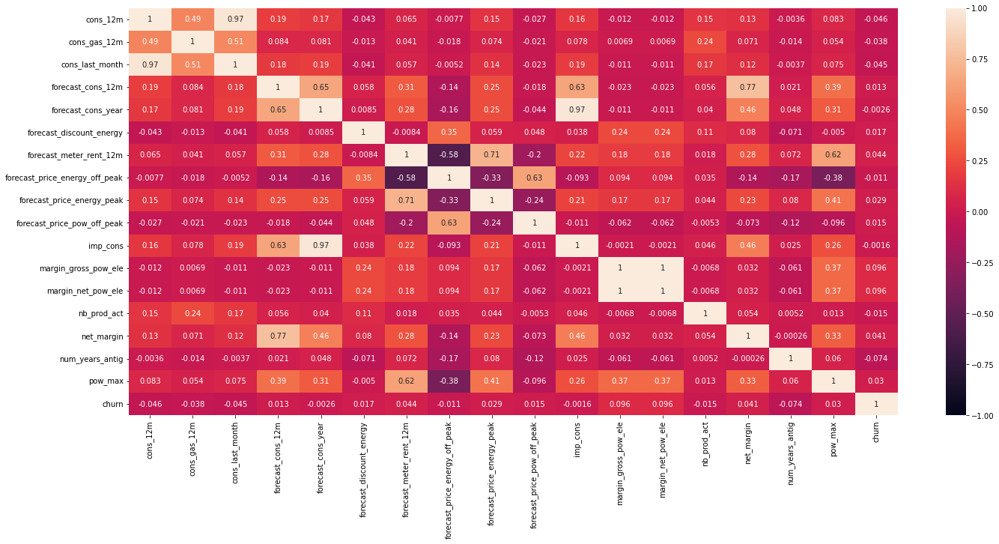

In [27]:
fig, ax = plt.subplots(figsize=(23,10)) 
sns.heatmap(df_corr, vmin=-1, vmax=1, annot=True,ax=ax)


<div class="alert alert-block alert-success">

1. we can notice a cluster of high positive and negative correlations between the prices of energy and power as these prices in the off peak, mid peak and peak depend on each other. for example we have a correlation equal to 0.97 between the prices of power mid peak and then peak. The higher mid peak prices the higher peak prices will be. On the other hand we have a negative correlation equal to -0.61 between peak price of power and off peak price of energy meaning that the higher prices of power in the peak the lower the prices of energy will be in the off peak and vice versa.
<br>
<br>
2. Looking at the cluster of the prices and the forecasts of these prices we can conclude that we have an overall highly positive correlation between these features except the energy price forcast off peak
<br>
<br>
3. On the other hand we notice also a high positive correlation between the current paid consumption and the forcast consumption of the year. a high positive correlation between the consumption of the last month and 12 month. We can also detect that the net_margin is moderately correlated to the forecast consumption 12 month which makes it accurate
    <div />

#### Sales Channels

In [28]:
channel = dfc[['id', 'channel_sales', 'churn']]
channel = channel.groupby([channel['channel_sales'], channel['churn']])['id'].count().unstack(level=1).fillna(0)
channel_churn = (channel.div(channel.sum(axis=1), axis=0) * 100).sort_values(by=[1], ascending=False)

In [29]:
fig = px.bar(channel_churn,barmode='stack',text_auto=True)
fig.show()

### Consumption

In [30]:
consumption = dfc[['id', 'cons_12m', 'cons_gas_12m', 'cons_last_month', 'imp_cons', 'has_gas', 'churn']]

In [31]:
fig = px.histogram(consumption,x="cons_12m",color='churn',barmode='stack',pattern_shape="churn")
fig.show()

In [32]:
fig = px.histogram(consumption,x="has_gas",color='churn',barmode='stack',pattern_shape="churn")
fig.show()

Our dataset is highly imbalanced as we have nearly 1/8 of our customers churning and 7/8 who are not overall.

In [33]:
fig = px.histogram(consumption,x="cons_gas_12m",color='churn',barmode='stack',pattern_shape="churn")
fig.show()

In [34]:
fig = px.histogram(consumption,x="cons_last_month",color='churn',barmode='stack',pattern_shape="churn")
fig.show()

In [35]:
fig = px.histogram(consumption,x="imp_cons",color='churn',barmode='stack',pattern_shape="churn")
fig.show()

In [36]:
fig=px.scatter(consumption,x='imp_cons',color="churn")
fig.show()
fig=px.scatter(consumption,x='has_gas',color="churn")
fig.show()
fig=px.scatter(consumption,x='cons_12m',color="churn")
fig.show()
fig=px.scatter(consumption,x='cons_last_month',color="churn")
fig.show()

Through these charts we can clearly notice 2 major things : 
<br>
1. the consumption distribution is skewed in almost all of the features
<br>
2. the presence of outliers that we will handle in the next phase

In [37]:


px.scatter(data_frame=dfc,x="cons_12m", y="forecast_cons_12m",
             color = 'churn')

This chart showcases the inaccuracy of the  forcasted consumption in the past 12 months compared to the actual consumption in the last 12 months

In [38]:

px.scatter(data_frame=dfc,x="imp_cons", y="forecast_cons_year",
             color = 'churn')

we can clearly see here the linearity in the paid consumption and the forcasted consumption in a year

In [39]:
   fig.update_layout(template='seaborn')

In [40]:
px.scatter(data_frame=dfc,x="num_years_antig", y="cons_12m",
             color = 'churn')

The antiquity of the customers reflect their consumption and as we can see the density of the consumption is overall located in those who have been customers for 3-6 years

### Margins

In [41]:
margin = dfc[['id', 'margin_gross_pow_ele', 'margin_net_pow_ele', 'net_margin']]

In [42]:
fig = px.box(data_frame=dfc,x='margin_gross_pow_ele')
fig.show()
fig = px.box(data_frame=dfc,x='margin_net_pow_ele')
fig.show()
fig = px.box(data_frame=dfc,x='net_margin')
fig.show()


similarly to the margin we detect the presence of outliers that will be handled

### Some other columns 

#### Number of active products

In [43]:
others = dfc[['id', 'nb_prod_act', 'num_years_antig', 'origin_up', 'churn']]
products = others.groupby([others["nb_prod_act"],others["churn"]])["id"].count().unstack(level=1)
products_percentage = (products.div(products.sum(axis=1), axis=0)*100).sort_values(by=[1], ascending=False)

In [44]:
fig = px.bar(products_percentage.transpose() ,barmode='stack', title="Churn number of active products",text_auto=True)
fig.show()

#### Years of antiquity

In [45]:
years_antig = others.groupby([others["num_years_antig"],others["churn"]])["id"].count().unstack(level=1)
years_antig_percentage = (years_antig.div(years_antig.sum(axis=1), axis=0)*100)


In [46]:
fig = px.bar(years_antig_percentage.transpose() ,barmode='stack', title="Churn number of active products",text_auto=True)
fig.show()

<div class="alert alert-block alert-success">
    Now that we have Explored our data let's start investigating the effect of the prices on the churning and discover the pattern of the impact of price  / churning
    <br>
    for that we will group the prices ( of power : fix / energy : var ) accordignly to the date through creating three dataframes : <b> <br>mean_year: the average prices in the last 12 months <br> mean_6m : the average prices in the last 6 months <br> mean_3m : the average price in the last 3 months</b>
    <br>
    We will then merge the three dataframes on the ID of the client to have the final price dataframe
   </div>

In [47]:
# let's convert the date columns to valid date columns
dfc["date_activ"] = pd.to_datetime(dfc["date_activ"], format='%Y-%m-%d')
dfc["date_end"] = pd.to_datetime(dfc["date_end"], format='%Y-%m-%d')
dfc["date_modif_prod"] = pd.to_datetime(dfc["date_modif_prod"], format='%Y-%m-%d')
dfc["date_renewal"] = pd.to_datetime(dfc["date_renewal"], format='%Y-%m-%d')
dfp['price_date'] = pd.to_datetime(dfp['price_date'], format='%Y-%m-%d')

# Now let us create the mean data frames
mean_year = dfp.groupby(['id']).mean().reset_index()
mean_6m = dfp[dfp['price_date'] > '2015-06-01'].groupby(['id']).mean().reset_index()
mean_3m = dfp[dfp['price_date'] > '2015-10-01'].groupby(['id']).mean().reset_index()

# moving onto combining into single dataframe
mean_year = mean_year.rename(
    index=str, 
    columns={
        "price_off_peak_var": "mean_year_price_p1_var",
        "price_peak_var": "mean_year_price_p2_var",
        "price_mid_peak_var": "mean_year_price_p3_var",
        "price_off_peak_fix": "mean_year_price_p1_fix",
        "price_peak_fix": "mean_year_price_p2_fix",
        "price_mid_peak_fix": "mean_year_price_p3_fix"
    }
)

mean_year["mean_year_price_p1"] = mean_year["mean_year_price_p1_var"] + mean_year["mean_year_price_p1_fix"]
mean_year["mean_year_price_p2"] = mean_year["mean_year_price_p2_var"] + mean_year["mean_year_price_p2_fix"]
mean_year["mean_year_price_p3"] = mean_year["mean_year_price_p3_var"] + mean_year["mean_year_price_p3_fix"]

mean_6m = mean_6m.rename(
    index=str, 
    columns={
        "price_off_peak_var": "mean_6m_price_p1_var",
        "price_peak_var": "mean_6m_price_p2_var",
        "price_mid_peak_var": "mean_6m_price_p3_var",
        "price_off_peak_fix": "mean_6m_price_p1_fix",
        "price_peak_fix": "mean_6m_price_p2_fix",
        "price_mid_peak_fix": "mean_6m_price_p3_fix"
    }
)
mean_6m["mean_6m_price_p1"] = mean_6m["mean_6m_price_p1_var"] + mean_6m["mean_6m_price_p1_fix"]
mean_6m["mean_6m_price_p2"] = mean_6m["mean_6m_price_p2_var"] + mean_6m["mean_6m_price_p2_fix"]
mean_6m["mean_6m_price_p3"] = mean_6m["mean_6m_price_p3_var"] + mean_6m["mean_6m_price_p3_fix"]

mean_3m = mean_3m.rename(
    index=str, 
    columns={
        "price_off_peak_var": "mean_3m_price_p1_var",
        "price_peak_var": "mean_3m_price_p2_var",
        "price_mid_peak_var": "mean_3m_price_p3_var",
        "price_off_peak_fix": "mean_3m_price_p1_fix",
        "price_peak_fix": "mean_3m_price_p2_fix",
        "price_mid_peak_fix": "mean_3m_price_p3_fix"
    }
)
mean_3m["mean_3m_price_p1"] = mean_3m["mean_3m_price_p1_var"] + mean_3m["mean_3m_price_p1_fix"]
mean_3m["mean_3m_price_p2"] = mean_3m["mean_3m_price_p2_var"] + mean_3m["mean_3m_price_p2_fix"]
mean_3m["mean_3m_price_p3"] = mean_3m["mean_3m_price_p3_var"] + mean_3m["mean_3m_price_p3_fix"]

# Now let's merge them into a final dataframe
price_features = pd.merge(mean_year, mean_6m, on='id')
price_features = pd.merge(price_features, mean_3m, on='id')

In [48]:
price_features

,id,mean_year_price_p1_var,mean_year_price_p2_var,mean_year_price_p3_var,mean_year_price_p1_fix,mean_year_price_p2_fix,mean_year_price_p3_fix,mean_year_price_p1,mean_year_price_p2,mean_year_price_p3,mean_6m_price_p1_var,mean_6m_price_p2_var,mean_6m_price_p3_var,mean_6m_price_p1_fix,mean_6m_price_p2_fix,mean_6m_price_p3_fix,mean_6m_price_p1,mean_6m_price_p2,mean_6m_price_p3,mean_3m_price_p1_var,mean_3m_price_p2_var,mean_3m_price_p3_var,mean_3m_price_p1_fix,mean_3m_price_p2_fix,mean_3m_price_p3_fix,mean_3m_price_p1,mean_3m_price_p2,mean_3m_price_p3
0,0002203ffbb812588b632b9e628cc38d,0.124338,0.103794,0.073160,40.701732,24.421038,16.280694,40.826071,24.524832,16.353854,0.121266,0.102368,0.073728,40.728885,24.437330,16.291555,40.850151,24.539698,16.365283,0.119906,0.101673,0.073719,40.728885,24.43733,16.291555,40.848791,24.539003,16.365274
1,0004351ebdd665e6ee664792efc4fd13,0.146426,0.000000,0.000000,44.385450,0.000000,0.000000,44.531877,0.000000,0.000000,0.144687,0.000000,0.000000,44.444710,0.000000,0.000000,44.589397,0.000000,0.000000,0.143943,0.000000,0.000000,44.444710,0.00000,0.000000,44.588653,0.000000,0.000000
2,0010bcc39e42b3c2131ed2ce55246e3c,0.181558,0.000000,0.000000,45.319710,0.000000,0.000000,45.501268,0.000000,0.000000,0.202024,0.000000,0.000000,45.944710,0.000000,0.000000,46.146734,0.000000,0.000000,0.201280,0.000000,0.000000,45.944710,0.00000,0.000000,46.145990,0.000000,0.000000
3,0010ee3855fdea87602a5b7aba8e42de,0.118757,0.098292,0.069032,40.647427,24.388455,16.258971,40.766185,24.486748,16.328003,0.114428,0.096080,0.069418,40.728885,24.437330,16.291555,40.843313,24.533410,16.360973,0.113068,0.095385,0.069409,40.728885,24.43733,16.291555,40.841953,24.532715,16.360964
4,00114d74e963e47177db89bc70108537,0.147926,0.000000,0.000000,44.266930,0.000000,0.000000,44.414856,0.000000,0.000000,0.146184,0.000000,0.000000,44.266930,0.000000,0.000000,44.413114,0.000000,0.000000,0.145440,0.000000,0.000000,44.266930,0.00000,0.000000,44.412370,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16090,ffef185810e44254c3a4c6395e6b4d8a,0.138863,0.115125,0.080780,40.896427,24.637456,16.507972,41.035291,24.752581,16.588752,0.113848,0.095499,0.068838,40.728885,24.437330,16.291555,40.842733,24.532829,16.360393,0.112488,0.094804,0.068829,40.728885,24.43733,16.291555,40.841373,24.532134,16.360384
16091,fffac626da707b1b5ab11e8431a4d0a2,0.147137,0.000000,0.000000,44.311375,0.000000,0.000000,44.458512,0.000000,0.000000,0.145449,0.000000,0.000000,44.355820,0.000000,0.000000,44.501269,0.000000,0.000000,0.145047,0.000000,0.000000,44.444710,0.00000,0.000000,44.589757,0.000000,0.000000
16092,fffc0cacd305dd51f316424bbb08d1bd,0.153879,0.129497,0.094842,41.160171,24.895768,16.763569,41.314049,25.025265,16.858411,0.152759,0.127566,0.091403,41.228885,24.937330,16.791555,41.381645,25.064896,16.882958,0.151399,0.126871,0.091394,41.228885,24.93733,16.791555,41.380284,25.064201,16.882949
16093,fffe4f5646aa39c7f97f95ae2679ce64,0.123858,0.103499,0.073735,40.606699,24.364017,16.242678,40.730558,24.467516,16.316414,0.120150,0.101570,0.073983,40.647429,24.388454,16.258969,40.767579,24.490024,16.332952,0.118175,0.100491,0.074516,40.728885,24.43733,16.291555,40.847060,24.537821,16.366071


In [49]:
# adding the churn column and merging with the ID
price_analysis = pd.merge(price_features, dfc[['id', 'churn']], on='id')
price_analysis.head()

,id,mean_year_price_p1_var,mean_year_price_p2_var,mean_year_price_p3_var,mean_year_price_p1_fix,mean_year_price_p2_fix,mean_year_price_p3_fix,mean_year_price_p1,mean_year_price_p2,mean_year_price_p3,mean_6m_price_p1_var,mean_6m_price_p2_var,mean_6m_price_p3_var,mean_6m_price_p1_fix,mean_6m_price_p2_fix,mean_6m_price_p3_fix,mean_6m_price_p1,mean_6m_price_p2,mean_6m_price_p3,mean_3m_price_p1_var,mean_3m_price_p2_var,mean_3m_price_p3_var,mean_3m_price_p1_fix,mean_3m_price_p2_fix,mean_3m_price_p3_fix,mean_3m_price_p1,mean_3m_price_p2,mean_3m_price_p3,churn
0,0002203ffbb812588b632b9e628cc38d,0.124338,0.103794,0.073160,40.701732,24.421038,16.280694,40.826071,24.524832,16.353854,0.121266,0.102368,0.073728,40.728885,24.43733,16.291555,40.850151,24.539698,16.365283,0.119906,0.101673,0.073719,40.728885,24.43733,16.291555,40.848791,24.539003,16.365274,0
1,0004351ebdd665e6ee664792efc4fd13,0.146426,0.000000,0.000000,44.385450,0.000000,0.000000,44.531877,0.000000,0.000000,0.144687,0.000000,0.000000,44.444710,0.00000,0.000000,44.589397,0.000000,0.000000,0.143943,0.000000,0.000000,44.444710,0.00000,0.000000,44.588653,0.000000,0.000000,0
2,0010bcc39e42b3c2131ed2ce55246e3c,0.181558,0.000000,0.000000,45.319710,0.000000,0.000000,45.501268,0.000000,0.000000,0.202024,0.000000,0.000000,45.944710,0.00000,0.000000,46.146734,0.000000,0.000000,0.201280,0.000000,0.000000,45.944710,0.00000,0.000000,46.145990,0.000000,0.000000,0
3,00114d74e963e47177db89bc70108537,0.147926,0.000000,0.000000,44.266930,0.000000,0.000000,44.414856,0.000000,0.000000,0.146184,0.000000,0.000000,44.266930,0.00000,0.000000,44.413114,0.000000,0.000000,0.145440,0.000000,0.000000,44.266930,0.00000,0.000000,44.412370,0.000000,0.000000,0
4,0013f326a839a2f6ad87a1859952d227,0.126076,0.105542,0.074921,40.728885,24.437330,16.291555,40.854961,24.542872,16.366476,0.123007,0.104108,0.075469,40.728885,24.43733,16.291555,40.851892,24.541438,16.367024,0.121647,0.103413,0.075460,40.728885,24.43733,16.291555,40.850532,24.540743,16.367015,0


##### let's explore the relationship between some of the price features from the mean_year the mean_

In [50]:
fig = px.scatter(price_analysis, x="mean_year_price_p1", y="churn", marginal_x="box", marginal_y="violin")
fig.show()

In [51]:
fig = px.scatter(price_analysis, x="mean_6m_price_p2", y="churn", marginal_x="box", marginal_y="violin")
fig.show()

In [52]:
fig = px.scatter(price_analysis, x="mean_3m_price_p3", y="churn", marginal_x="box", marginal_y="violin")
fig.show()

There is a very low positive correlation with the churn shown in the previous 3 jointgridss 

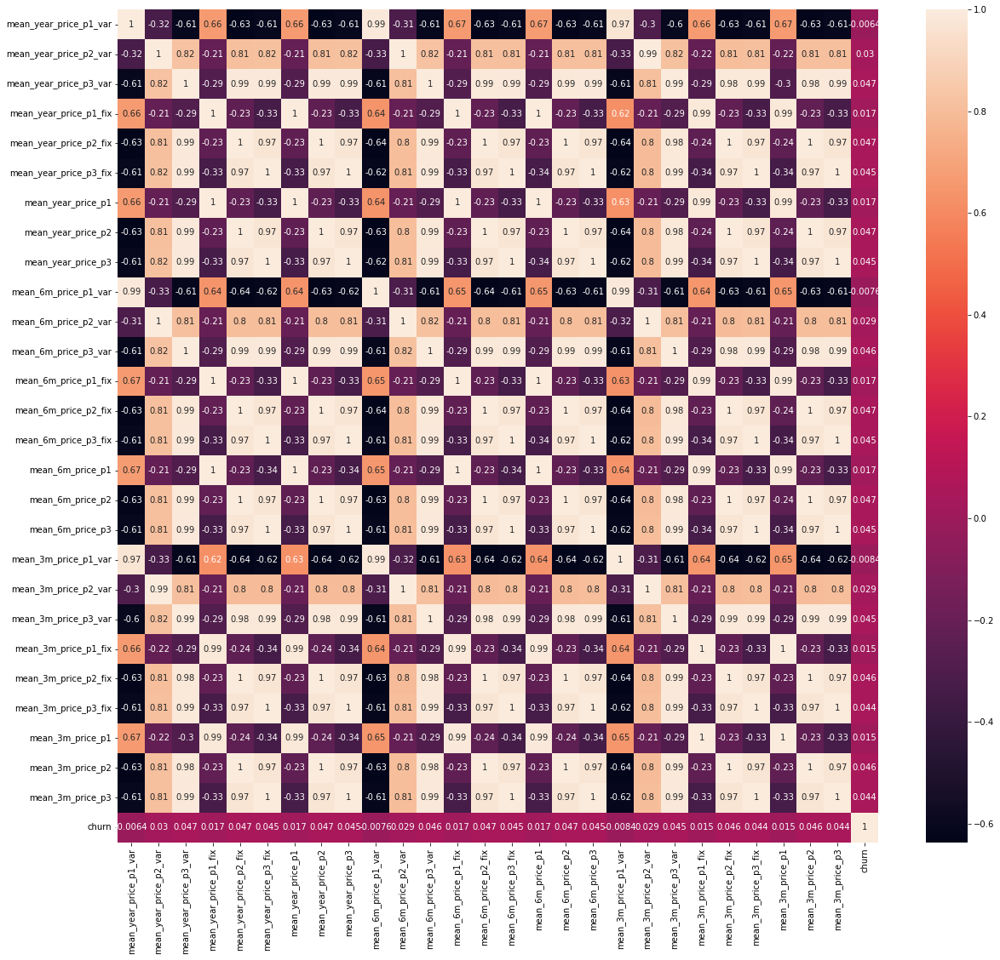

In [53]:
corr = price_analysis.corr()
# Plot correlation
plt.figure(figsize=(20,18))
sns.heatmap(corr, xticklabels=corr.columns.values, yticklabels=corr.columns.values, annot = True, annot_kws={'size':10})
# Axis ticks size
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)
plt.show()

<div class="alert alert-block alert-info">
    Looking at the heat map we can clearly see the non correlation between the <b> the price features and the churn feature and thus we can conclude the absence of effect of the price on churning of customers</b>
    </div>

# Data Preparation

<div class="alert alert-block alert-info">
 Since the pricess have no effect on the churning of the customers we will discard the prices dataframe and focus on the client dataframe and do the necassary transformations to prepare the data for our model
    </div>

<div class="alert alert-block alert-warning">
our approach will be like the following : 
    <ul>
        <li>
           Data transformation 
        </li>
        <li>
           Outliers Handling 
        </li>
        <li>
            Data imputation 
        </li>
         <li>
            Feature Encoding 
        </li>
        <li>
            Feature Engineering 
        </li>
        <li>
            Feature Normalization
        </li>
        <li>
            Feature Selection
        </li>
    </ul>
    </div>

### Data Transformation

 As shown in the exploratory data analysis phase our numerical features are highly <b> skewed </b>. We need to handle this skewness since most of the predictive models typically assume that the data is independent and normally distributed.<br>
Some of the techniques to use for skewness handling are <b>Square root - Cubic root - Logarithm</b>. in our case we will use the logarithm technique for positive high skewness

In [54]:
#extracting the skewed columns
skewed_columns = [
'cons_12m',
'cons_gas_12m',
'cons_last_month',
'forecast_cons_12m',
'forecast_cons_year',
'forecast_discount_energy',
'forecast_meter_rent_12m',
'forecast_price_energy_off_peak',
'forecast_price_energy_peak',
'forecast_price_pow_off_peak'
]


In [55]:
# Apply inglog10 transformation
dfc["cons_12m"] = np.sqrt(dfc["cons_12m"] )
dfc["cons_gas_12m"] = np.sqrt(dfc["cons_gas_12m"] )
dfc["cons_last_month"] = np.sqrt(dfc["cons_last_month"] )
dfc["forecast_cons_12m"] = np.sqrt(dfc["forecast_cons_12m"] )
dfc["forecast_cons_year"] = np.sqrt(dfc["forecast_cons_year"] )
dfc["forecast_meter_rent_12m"] = np.sqrt(dfc["forecast_meter_rent_12m"])
dfc["imp_cons"] = np.sqrt(dfc["imp_cons"] )

Now let's see some of the new distributions

In [56]:
dfc

,id,channel_sales,cons_12m,cons_gas_12m,cons_last_month,date_activ,date_end,date_modif_prod,date_renewal,forecast_cons_12m,forecast_cons_year,forecast_discount_energy,forecast_meter_rent_12m,forecast_price_energy_off_peak,forecast_price_energy_peak,forecast_price_pow_off_peak,has_gas,imp_cons,margin_gross_pow_ele,margin_net_pow_ele,nb_prod_act,net_margin,num_years_antig,origin_up,pow_max,churn
0,24011ae4ebbe3035111d65fa7c15bc57,foosdfpfkusacimwkcsosbicdxkicaua,0.000000,234.405631,0.000000,2013-06-15,2016-06-15,2015-11-01,2015-06-23,0.000000,0.000000,0.0,1.334166,0.114481,0.098142,40.606701,t,0.000000,25.44,25.44,2,678.99,3,lxidpiddsbxsbosboudacockeimpuepw,43.648,1
1,d29c2c54acc38ff3c0614d0a653813dd,MISSING,68.264193,0.000000,0.000000,2009-08-21,2016-08-30,2009-08-21,2015-08-31,13.782235,0.000000,0.0,4.033609,0.145711,0.000000,44.311378,f,0.000000,16.38,16.38,1,18.89,6,kamkkxfxxuwbdslkwifmmcsiusiuosws,13.800,0
2,764c75f661154dac3a6c254cd082ea7d,foosdfpfkusacimwkcsosbicdxkicaua,23.323808,0.000000,0.000000,2010-04-16,2016-04-16,2010-04-16,2015-04-17,6.925316,0.000000,0.0,6.222540,0.165794,0.087899,44.311378,f,0.000000,28.60,28.60,1,6.60,6,kamkkxfxxuwbdslkwifmmcsiusiuosws,13.856,0
3,bba03439a292a1e166f80264c16191cb,lmkebamcaaclubfxadlmueccxoimlema,39.799497,0.000000,0.000000,2010-03-30,2016-03-30,2010-03-30,2015-03-31,15.493224,0.000000,0.0,4.453089,0.146694,0.000000,44.311378,f,0.000000,30.22,30.22,1,25.46,6,kamkkxfxxuwbdslkwifmmcsiusiuosws,13.200,0
4,149d57cf92fc41cf94415803a877cb4b,MISSING,66.520673,0.000000,22.934690,2010-01-13,2016-03-07,2010-01-13,2015-03-09,21.112792,22.934690,0.0,11.477369,0.116900,0.100015,40.606701,f,7.233257,44.91,44.91,1,47.98,6,kamkkxfxxuwbdslkwifmmcsiusiuosws,19.800,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14601,18463073fb097fc0ac5d3e040f356987,foosdfpfkusacimwkcsosbicdxkicaua,179.638526,218.952050,0.000000,2012-05-24,2016-05-08,2015-05-08,2014-05-26,68.176316,0.000000,0.0,4.309292,0.138305,0.000000,44.311378,t,0.000000,27.88,27.88,2,381.77,4,lxidpiddsbxsbosboudacockeimpuepw,15.000,0
14602,d0a6f71671571ed83b2645d23af6de00,foosdfpfkusacimwkcsosbicdxkicaua,84.988234,0.000000,13.453624,2012-08-27,2016-08-27,2012-08-27,2015-08-28,25.133444,13.453624,0.0,12.001250,0.100167,0.091892,58.995952,f,3.992493,0.00,0.00,1,90.34,3,lxidpiddsbxsbosboudacockeimpuepw,6.000,1
14603,10e6828ddd62cbcf687cb74928c4c2d2,foosdfpfkusacimwkcsosbicdxkicaua,42.941821,0.000000,13.379088,2012-02-08,2016-02-07,2012-02-08,2015-02-09,13.798188,13.379088,0.0,11.384200,0.116900,0.100015,40.606701,f,4.248529,39.84,39.84,1,20.38,4,lxidpiddsbxsbosboudacockeimpuepw,15.935,1
14604,1cf20fd6206d7678d5bcafd28c53b4db,foosdfpfkusacimwkcsosbicdxkicaua,11.445523,0.000000,0.000000,2012-08-30,2016-08-30,2012-08-30,2015-08-31,4.397727,0.000000,0.0,2.679552,0.145711,0.000000,44.311378,f,0.000000,13.08,13.08,1,0.96,3,lxidpiddsbxsbosboudacockeimpuepw,11.000,0


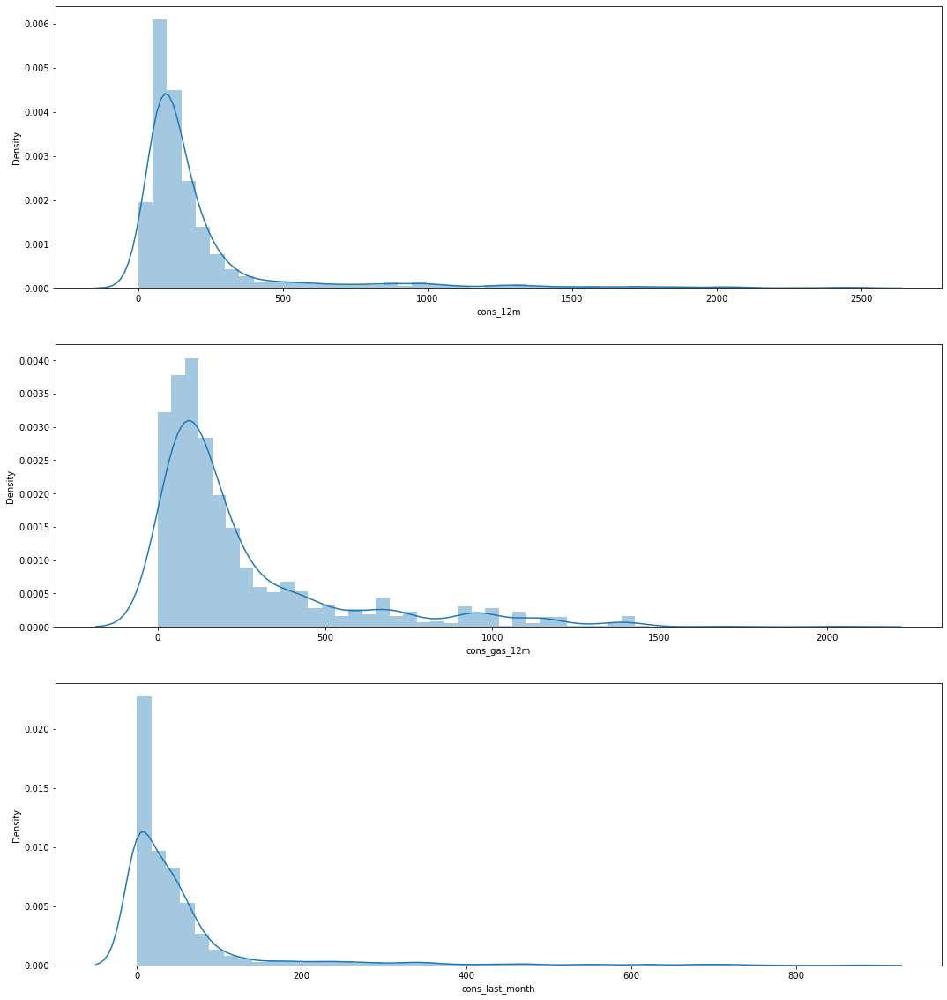

In [57]:
 fig, axs = plt.subplots(nrows=3, figsize=(18, 20))

sns.distplot((dfc["cons_12m"].dropna()), ax=axs[0])
sns.distplot((dfc[dfc["has_gas"]=='t']["cons_gas_12m"].dropna()), ax=axs[1])
sns.distplot((dfc["cons_last_month"].dropna()), ax=axs[2])
plt.show()


This technique handled the skewness quite well ! Now we have a normal distribution almost on most of our features

### Handling outliers

In [58]:
dfc = dfc[dfc["forecast_cons_12m"]<40000]
dfc = dfc[dfc["imp_cons"]<9000]
dfc = dfc[dfc["margin_gross_pow_ele"]<230]
dfc = dfc[dfc["margin_net_pow_ele"]<230]
dfc = dfc[dfc["net_margin"]<5000]

In [59]:
dfc.shape

(14600, 26)

In [60]:
dfc.reset_index(drop=True,inplace=True)

### data imputation

In [61]:
channel_sales_freq = dfc['channel_sales'].value_counts()


In [62]:
channel_sales_freq.mode()

0       2
1       3
2      11
3     893
4    1374
5    1843
6    3724
7    6750
Name: channel_sales, dtype: int64

In [63]:
# we will fill the missing value with the most frequent channel_sales
dfc.loc[dfc["channel_sales"]=="MISSING","channel_sales"]="foosdfpfkusacimwkcsosbicdxkicaua"

In [64]:
dfc["channel_sales"].unique()

array(['foosdfpfkusacimwkcsosbicdxkicaua',
       'lmkebamcaaclubfxadlmueccxoimlema',
       'usilxuppasemubllopkaafesmlibmsdf',
       'ewpakwlliwisiwduibdlfmalxowmwpci',
       'epumfxlbckeskwekxbiuasklxalciiuu',
       'sddiedcslfslkckwlfkdpoeeailfpeds',
       'fixdbufsefwooaasfcxdxadsiekoceaa'], dtype=object)

### Feature Encoding

We will start by converting the IDs into numbers

In [65]:
dfc

,id,channel_sales,cons_12m,cons_gas_12m,cons_last_month,date_activ,date_end,date_modif_prod,date_renewal,forecast_cons_12m,forecast_cons_year,forecast_discount_energy,forecast_meter_rent_12m,forecast_price_energy_off_peak,forecast_price_energy_peak,forecast_price_pow_off_peak,has_gas,imp_cons,margin_gross_pow_ele,margin_net_pow_ele,nb_prod_act,net_margin,num_years_antig,origin_up,pow_max,churn
0,24011ae4ebbe3035111d65fa7c15bc57,foosdfpfkusacimwkcsosbicdxkicaua,0.000000,234.405631,0.000000,2013-06-15,2016-06-15,2015-11-01,2015-06-23,0.000000,0.000000,0.0,1.334166,0.114481,0.098142,40.606701,t,0.000000,25.44,25.44,2,678.99,3,lxidpiddsbxsbosboudacockeimpuepw,43.648,1
1,d29c2c54acc38ff3c0614d0a653813dd,foosdfpfkusacimwkcsosbicdxkicaua,68.264193,0.000000,0.000000,2009-08-21,2016-08-30,2009-08-21,2015-08-31,13.782235,0.000000,0.0,4.033609,0.145711,0.000000,44.311378,f,0.000000,16.38,16.38,1,18.89,6,kamkkxfxxuwbdslkwifmmcsiusiuosws,13.800,0
2,764c75f661154dac3a6c254cd082ea7d,foosdfpfkusacimwkcsosbicdxkicaua,23.323808,0.000000,0.000000,2010-04-16,2016-04-16,2010-04-16,2015-04-17,6.925316,0.000000,0.0,6.222540,0.165794,0.087899,44.311378,f,0.000000,28.60,28.60,1,6.60,6,kamkkxfxxuwbdslkwifmmcsiusiuosws,13.856,0
3,bba03439a292a1e166f80264c16191cb,lmkebamcaaclubfxadlmueccxoimlema,39.799497,0.000000,0.000000,2010-03-30,2016-03-30,2010-03-30,2015-03-31,15.493224,0.000000,0.0,4.453089,0.146694,0.000000,44.311378,f,0.000000,30.22,30.22,1,25.46,6,kamkkxfxxuwbdslkwifmmcsiusiuosws,13.200,0
4,149d57cf92fc41cf94415803a877cb4b,foosdfpfkusacimwkcsosbicdxkicaua,66.520673,0.000000,22.934690,2010-01-13,2016-03-07,2010-01-13,2015-03-09,21.112792,22.934690,0.0,11.477369,0.116900,0.100015,40.606701,f,7.233257,44.91,44.91,1,47.98,6,kamkkxfxxuwbdslkwifmmcsiusiuosws,19.800,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14595,18463073fb097fc0ac5d3e040f356987,foosdfpfkusacimwkcsosbicdxkicaua,179.638526,218.952050,0.000000,2012-05-24,2016-05-08,2015-05-08,2014-05-26,68.176316,0.000000,0.0,4.309292,0.138305,0.000000,44.311378,t,0.000000,27.88,27.88,2,381.77,4,lxidpiddsbxsbosboudacockeimpuepw,15.000,0
14596,d0a6f71671571ed83b2645d23af6de00,foosdfpfkusacimwkcsosbicdxkicaua,84.988234,0.000000,13.453624,2012-08-27,2016-08-27,2012-08-27,2015-08-28,25.133444,13.453624,0.0,12.001250,0.100167,0.091892,58.995952,f,3.992493,0.00,0.00,1,90.34,3,lxidpiddsbxsbosboudacockeimpuepw,6.000,1
14597,10e6828ddd62cbcf687cb74928c4c2d2,foosdfpfkusacimwkcsosbicdxkicaua,42.941821,0.000000,13.379088,2012-02-08,2016-02-07,2012-02-08,2015-02-09,13.798188,13.379088,0.0,11.384200,0.116900,0.100015,40.606701,f,4.248529,39.84,39.84,1,20.38,4,lxidpiddsbxsbosboudacockeimpuepw,15.935,1
14598,1cf20fd6206d7678d5bcafd28c53b4db,foosdfpfkusacimwkcsosbicdxkicaua,11.445523,0.000000,0.000000,2012-08-30,2016-08-30,2012-08-30,2015-08-31,4.397727,0.000000,0.0,2.679552,0.145711,0.000000,44.311378,f,0.000000,13.08,13.08,1,0.96,3,lxidpiddsbxsbosboudacockeimpuepw,11.000,0


We will now be using target encoding for the channel sales feature using ordinal encoding

In [66]:
from sklearn.preprocessing import OrdinalEncoder
ord_enc = OrdinalEncoder()
dfc["channel_sales"] = ord_enc.fit_transform(dfc[["channel_sales"]])


In [67]:
ord_enc = OrdinalEncoder()
dfc["id"] = ord_enc.fit_transform(dfc[["id"]])


In [68]:

dfc["origin_up"] = ord_enc.fit_transform(dfc[["origin_up"]])

In [69]:

dfc["has_gas"] = ord_enc.fit_transform(dfc[["has_gas"]])

In [70]:
dfc

,id,channel_sales,cons_12m,cons_gas_12m,cons_last_month,date_activ,date_end,date_modif_prod,date_renewal,forecast_cons_12m,forecast_cons_year,forecast_discount_energy,forecast_meter_rent_12m,forecast_price_energy_off_peak,forecast_price_energy_peak,forecast_price_pow_off_peak,has_gas,imp_cons,margin_gross_pow_ele,margin_net_pow_ele,nb_prod_act,net_margin,num_years_antig,origin_up,pow_max,churn
0,2116.0,3.0,0.000000,234.405631,0.000000,2013-06-15,2016-06-15,2015-11-01,2015-06-23,0.000000,0.000000,0.0,1.334166,0.114481,0.098142,40.606701,1.0,0.000000,25.44,25.44,2,678.99,3,4.0,43.648,1
1,12004.0,3.0,68.264193,0.000000,0.000000,2009-08-21,2016-08-30,2009-08-21,2015-08-31,13.782235,0.000000,0.0,4.033609,0.145711,0.000000,44.311378,0.0,0.000000,16.38,16.38,1,18.89,6,2.0,13.800,0
2,6713.0,3.0,23.323808,0.000000,0.000000,2010-04-16,2016-04-16,2010-04-16,2015-04-17,6.925316,0.000000,0.0,6.222540,0.165794,0.087899,44.311378,0.0,0.000000,28.60,28.60,1,6.60,6,2.0,13.856,0
3,10657.0,4.0,39.799497,0.000000,0.000000,2010-03-30,2016-03-30,2010-03-30,2015-03-31,15.493224,0.000000,0.0,4.453089,0.146694,0.000000,44.311378,0.0,0.000000,30.22,30.22,1,25.46,6,2.0,13.200,0
4,1194.0,3.0,66.520673,0.000000,22.934690,2010-01-13,2016-03-07,2010-01-13,2015-03-09,21.112792,22.934690,0.0,11.477369,0.116900,0.100015,40.606701,0.0,7.233257,44.91,44.91,1,47.98,6,2.0,19.800,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14595,1409.0,3.0,179.638526,218.952050,0.000000,2012-05-24,2016-05-08,2015-05-08,2014-05-26,68.176316,0.000000,0.0,4.309292,0.138305,0.000000,44.311378,1.0,0.000000,27.88,27.88,2,381.77,4,4.0,15.000,0
14596,11880.0,3.0,84.988234,0.000000,13.453624,2012-08-27,2016-08-27,2012-08-27,2015-08-28,25.133444,13.453624,0.0,12.001250,0.100167,0.091892,58.995952,0.0,3.992493,0.00,0.00,1,90.34,3,4.0,6.000,1
14597,996.0,3.0,42.941821,0.000000,13.379088,2012-02-08,2016-02-07,2012-02-08,2015-02-09,13.798188,13.379088,0.0,11.384200,0.116900,0.100015,40.606701,0.0,4.248529,39.84,39.84,1,20.38,4,4.0,15.935,1
14598,1676.0,3.0,11.445523,0.000000,0.000000,2012-08-30,2016-08-30,2012-08-30,2015-08-31,4.397727,0.000000,0.0,2.679552,0.145711,0.000000,44.311378,0.0,0.000000,13.08,13.08,1,0.96,3,4.0,11.000,0


In [71]:
dfc.drop([14596,14597,14598,14599],inplace=True)

Now that we have all of our data in numerical format let's conduct a further outliers handling using the Isolation Forest algorithm.

The Isolation Forest algorithm is a fast tree-based algorithm for anomaly detection.
it takes advantage of the following properties : 

Fewness : anomalous samples are a minority and there will only be a few of them in any dataset

Different : anomalous samples have values/attributes that are very different from those of normal samples

In [72]:
from sklearn.ensemble import IsolationForest

In [73]:
# def remove_outliers(df):
#     clf = IsolationForest(random_state=0).fit(df)
#     anomaly = clf.predict(df)
#     df['anomaly']= anomaly
#     outliers=df.loc[df['anomaly']==-1]
#     outlier_index=list(outliers.index)
#     print(df['anomaly'].value_counts())
#     df = df[df['anomaly'] != -1]
#     return df.loc[df['anomaly']== 1]

In [74]:
# dfc = remove_outliers(dfc) 
# dfc.drop(['anomaly'], axis=1, inplace=True)

### Feature Engineering

We will follow a grouping approach for feature engineering and we will be creating the following features <br>
1. total consumption of gs <br>
2. forecasted price energy in total<br>
3. contact duration = date end - date active in days<br>


In [75]:
dfc['total_cons_12m'] = dfc['cons_12m'] + dfc['cons_gas_12m']

In [76]:
dfc['fore_casted_price_energy_total'] = dfc['forecast_price_energy_off_peak'] + dfc['forecast_price_energy_peak']

handling date features

In [77]:
def extract_date(df,date_col_name):
    #extracting year, month, day
    for i in range(len(df)):
        dates = df[date_col_name]
        date = dates[i].to_pydatetime().date()
        year = date.year
        month = date.month
        day = date.day
        
    #affecting the values to columns
        df.loc[i,'year_'+ date_col_name] = year
        df.loc[i,'month_'+ date_col_name] = month
        df.loc[i,'day_'+ date_col_name] = day
    return df

In [78]:
dfc = extract_date(dfc,"date_activ")
dfc = extract_date(dfc,"date_end")
dfc = extract_date(dfc,"date_modif_prod")
dfc = extract_date(dfc,"date_renewal")

In [79]:
dfc

,id,channel_sales,cons_12m,cons_gas_12m,cons_last_month,date_activ,date_end,date_modif_prod,date_renewal,forecast_cons_12m,forecast_cons_year,forecast_discount_energy,forecast_meter_rent_12m,forecast_price_energy_off_peak,forecast_price_energy_peak,forecast_price_pow_off_peak,has_gas,imp_cons,margin_gross_pow_ele,margin_net_pow_ele,nb_prod_act,net_margin,num_years_antig,origin_up,pow_max,churn,total_cons_12m,fore_casted_price_energy_total,year_date_activ,month_date_activ,day_date_activ,year_date_end,month_date_end,day_date_end,year_date_modif_prod,month_date_modif_prod,day_date_modif_prod,year_date_renewal,month_date_renewal,day_date_renewal
0,2116.0,3.0,0.000000,234.405631,0.000000,2013-06-15,2016-06-15,2015-11-01,2015-06-23,0.000000,0.000000,0.0,1.334166,0.114481,0.098142,40.606701,1.0,0.000000,25.44,25.44,2,678.99,3,4.0,43.648,1,234.405631,0.212623,2013.0,6.0,15.0,2016.0,6.0,15.0,2015.0,11.0,1.0,2015.0,6.0,23.0
1,12004.0,3.0,68.264193,0.000000,0.000000,2009-08-21,2016-08-30,2009-08-21,2015-08-31,13.782235,0.000000,0.0,4.033609,0.145711,0.000000,44.311378,0.0,0.000000,16.38,16.38,1,18.89,6,2.0,13.800,0,68.264193,0.145711,2009.0,8.0,21.0,2016.0,8.0,30.0,2009.0,8.0,21.0,2015.0,8.0,31.0
2,6713.0,3.0,23.323808,0.000000,0.000000,2010-04-16,2016-04-16,2010-04-16,2015-04-17,6.925316,0.000000,0.0,6.222540,0.165794,0.087899,44.311378,0.0,0.000000,28.60,28.60,1,6.60,6,2.0,13.856,0,23.323808,0.253693,2010.0,4.0,16.0,2016.0,4.0,16.0,2010.0,4.0,16.0,2015.0,4.0,17.0
3,10657.0,4.0,39.799497,0.000000,0.000000,2010-03-30,2016-03-30,2010-03-30,2015-03-31,15.493224,0.000000,0.0,4.453089,0.146694,0.000000,44.311378,0.0,0.000000,30.22,30.22,1,25.46,6,2.0,13.200,0,39.799497,0.146694,2010.0,3.0,30.0,2016.0,3.0,30.0,2010.0,3.0,30.0,2015.0,3.0,31.0
4,1194.0,3.0,66.520673,0.000000,22.934690,2010-01-13,2016-03-07,2010-01-13,2015-03-09,21.112792,22.934690,0.0,11.477369,0.116900,0.100015,40.606701,0.0,7.233257,44.91,44.91,1,47.98,6,2.0,19.800,0,66.520673,0.216915,2010.0,1.0,13.0,2016.0,3.0,7.0,2010.0,1.0,13.0,2015.0,3.0,9.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14591,9912.0,1.0,91.159201,0.000000,26.172505,2012-12-18,2016-12-18,2012-12-18,2015-12-21,28.862606,26.172505,0.0,11.478676,0.115237,0.100123,40.939027,0.0,8.187185,24.02,24.02,1,102.52,3,2.0,23.100,0,91.159201,0.215360,2012.0,12.0,18.0,2016.0,12.0,18.0,2012.0,12.0,18.0,2015.0,12.0,21.0
14592,1244.0,3.0,97.164808,0.000000,21.908902,2009-10-08,2016-10-08,2015-05-24,2015-10-09,31.368296,21.908902,0.0,11.493911,0.115237,0.100123,40.939027,0.0,6.854196,20.00,20.00,1,113.17,6,3.0,15.001,0,97.164808,0.215360,2009.0,10.0,8.0,2016.0,10.0,8.0,2015.0,5.0,24.0,2015.0,10.0,9.0
14593,4089.0,3.0,134.770175,55.099909,0.000000,2010-01-26,2017-01-26,2015-11-17,2016-01-27,51.612208,0.000000,0.0,4.043513,0.143575,0.000000,44.311378,1.0,0.000000,31.20,31.20,3,254.81,6,2.0,13.856,0,189.870084,0.143575,2010.0,1.0,26.0,2017.0,1.0,26.0,2015.0,11.0,17.0,2016.0,1.0,27.0
14594,11158.0,3.0,295.205014,0.000000,106.616134,2013-02-08,2016-02-08,2013-02-08,2015-02-09,26.689511,26.702060,0.0,12.075595,0.120372,0.103487,40.606701,0.0,8.474078,66.00,66.00,1,87.14,3,4.0,26.400,0,295.205014,0.223859,2013.0,2.0,8.0,2016.0,2.0,8.0,2013.0,2.0,8.0,2015.0,2.0,9.0


In [80]:
dfc.drop(columns=['date_activ',"date_end","date_modif_prod","date_renewal"],inplace=True)

In [81]:
dfc

,id,channel_sales,cons_12m,cons_gas_12m,cons_last_month,forecast_cons_12m,forecast_cons_year,forecast_discount_energy,forecast_meter_rent_12m,forecast_price_energy_off_peak,forecast_price_energy_peak,forecast_price_pow_off_peak,has_gas,imp_cons,margin_gross_pow_ele,margin_net_pow_ele,nb_prod_act,net_margin,num_years_antig,origin_up,pow_max,churn,total_cons_12m,fore_casted_price_energy_total,year_date_activ,month_date_activ,day_date_activ,year_date_end,month_date_end,day_date_end,year_date_modif_prod,month_date_modif_prod,day_date_modif_prod,year_date_renewal,month_date_renewal,day_date_renewal
0,2116.0,3.0,0.000000,234.405631,0.000000,0.000000,0.000000,0.0,1.334166,0.114481,0.098142,40.606701,1.0,0.000000,25.44,25.44,2,678.99,3,4.0,43.648,1,234.405631,0.212623,2013.0,6.0,15.0,2016.0,6.0,15.0,2015.0,11.0,1.0,2015.0,6.0,23.0
1,12004.0,3.0,68.264193,0.000000,0.000000,13.782235,0.000000,0.0,4.033609,0.145711,0.000000,44.311378,0.0,0.000000,16.38,16.38,1,18.89,6,2.0,13.800,0,68.264193,0.145711,2009.0,8.0,21.0,2016.0,8.0,30.0,2009.0,8.0,21.0,2015.0,8.0,31.0
2,6713.0,3.0,23.323808,0.000000,0.000000,6.925316,0.000000,0.0,6.222540,0.165794,0.087899,44.311378,0.0,0.000000,28.60,28.60,1,6.60,6,2.0,13.856,0,23.323808,0.253693,2010.0,4.0,16.0,2016.0,4.0,16.0,2010.0,4.0,16.0,2015.0,4.0,17.0
3,10657.0,4.0,39.799497,0.000000,0.000000,15.493224,0.000000,0.0,4.453089,0.146694,0.000000,44.311378,0.0,0.000000,30.22,30.22,1,25.46,6,2.0,13.200,0,39.799497,0.146694,2010.0,3.0,30.0,2016.0,3.0,30.0,2010.0,3.0,30.0,2015.0,3.0,31.0
4,1194.0,3.0,66.520673,0.000000,22.934690,21.112792,22.934690,0.0,11.477369,0.116900,0.100015,40.606701,0.0,7.233257,44.91,44.91,1,47.98,6,2.0,19.800,0,66.520673,0.216915,2010.0,1.0,13.0,2016.0,3.0,7.0,2010.0,1.0,13.0,2015.0,3.0,9.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14591,9912.0,1.0,91.159201,0.000000,26.172505,28.862606,26.172505,0.0,11.478676,0.115237,0.100123,40.939027,0.0,8.187185,24.02,24.02,1,102.52,3,2.0,23.100,0,91.159201,0.215360,2012.0,12.0,18.0,2016.0,12.0,18.0,2012.0,12.0,18.0,2015.0,12.0,21.0
14592,1244.0,3.0,97.164808,0.000000,21.908902,31.368296,21.908902,0.0,11.493911,0.115237,0.100123,40.939027,0.0,6.854196,20.00,20.00,1,113.17,6,3.0,15.001,0,97.164808,0.215360,2009.0,10.0,8.0,2016.0,10.0,8.0,2015.0,5.0,24.0,2015.0,10.0,9.0
14593,4089.0,3.0,134.770175,55.099909,0.000000,51.612208,0.000000,0.0,4.043513,0.143575,0.000000,44.311378,1.0,0.000000,31.20,31.20,3,254.81,6,2.0,13.856,0,189.870084,0.143575,2010.0,1.0,26.0,2017.0,1.0,26.0,2015.0,11.0,17.0,2016.0,1.0,27.0
14594,11158.0,3.0,295.205014,0.000000,106.616134,26.689511,26.702060,0.0,12.075595,0.120372,0.103487,40.606701,0.0,8.474078,66.00,66.00,1,87.14,3,4.0,26.400,0,295.205014,0.223859,2013.0,2.0,8.0,2016.0,2.0,8.0,2013.0,2.0,8.0,2015.0,2.0,9.0


### feature Normalization

Now at this level we will move on to `Feature normalization` which is a process of scaling the data between 0 and 1 in order to facilitate the processing of the data for our modelling algorithm whilst creating our model and aim for better results. since this is numerical scaling we will only work on the numerical features only

In [264]:
def featureSelect(df_x):
    return df_x.drop(['churn'], axis=1), df_x['churn']

In [265]:
def Normalization(X, scaler="minmax"):
    if scaler.upper() == "STANDARD":
        stand = StandardScaler()
        X_s = stand.fit_transform(X)
        return X_s
    else:
        minmax = MinMaxScaler()
        X_mm = minmax.fit_transform(X)
        return X_mm

In [266]:
X, y = featureSelect(dfc)

In [267]:
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=42, test_size=0.2)

<IPython.core.display.Javascript object>

Now let's normalize our numerical features

In [268]:
dfc.columns

Index(['id', 'channel_sales', 'cons_12m', 'cons_gas_12m', 'cons_last_month',
       'forecast_cons_12m', 'forecast_cons_year', 'forecast_discount_energy',
       'forecast_meter_rent_12m', 'forecast_price_energy_off_peak',
       'forecast_price_energy_peak', 'forecast_price_pow_off_peak', 'has_gas',
       'imp_cons', 'margin_gross_pow_ele', 'margin_net_pow_ele', 'nb_prod_act',
       'net_margin', 'num_years_antig', 'origin_up', 'pow_max', 'churn',
       'total_cons_12m', 'fore_casted_price_energy_total', 'year_date_activ',
       'month_date_activ', 'day_date_activ', 'year_date_end', 'month_date_end',
       'day_date_end', 'year_date_modif_prod', 'month_date_modif_prod',
       'day_date_modif_prod', 'year_date_renewal', 'month_date_renewal',
       'day_date_renewal'],
      dtype='object')

In [269]:
col_to_norm =[ 'id', 'channel_sales', 'cons_12m', 'cons_gas_12m', 'cons_last_month',
       'forecast_cons_12m', 'forecast_cons_year', 'forecast_discount_energy',
       'forecast_meter_rent_12m', 'forecast_price_energy_off_peak',
       'forecast_price_energy_peak', 'forecast_price_pow_off_peak', 'has_gas',
       'imp_cons', 'margin_gross_pow_ele', 'margin_net_pow_ele', 'nb_prod_act',
       'net_margin', 'num_years_antig', 'origin_up', 'pow_max',
       'total_cons_12m', 'fore_casted_price_energy_total', 'year_date_activ',
       'month_date_activ', 'day_date_activ', 'year_date_end', 'month_date_end',
       'day_date_end', 'year_date_modif_prod', 'month_date_modif_prod',
       'day_date_modif_prod', 'year_date_renewal', 'month_date_renewal',
       'day_date_renewal']

In [270]:
X_train[col_to_norm] = Normalization(X_train[col_to_norm])

<IPython.core.display.Javascript object>

### Feature Selection

In [271]:
# CatBoost model definition
catboost_model = CatBoostClassifier(iterations=1000,
                                    custom_loss=['Accuracy'],
                                    loss_function='Logloss'
                                   )
train_pool = Pool(X_train,y_train)
# Fit CatBoost model
catboost_model.fit(train_pool,
                   plot=True)

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

Learning rate set to 0.029422
0:	learn: 0.6664131	total: 24.5ms	remaining: 24.5s
1:	learn: 0.6414146	total: 34.6ms	remaining: 17.3s
2:	learn: 0.6179993	total: 44.6ms	remaining: 14.8s
3:	learn: 0.5970440	total: 54.1ms	remaining: 13.5s
4:	learn: 0.5773781	total: 63.8ms	remaining: 12.7s
5:	learn: 0.5585749	total: 73.6ms	remaining: 12.2s
6:	learn: 0.5409450	total: 83.6ms	remaining: 11.9s
7:	learn: 0.5247728	total: 93.4ms	remaining: 11.6s
8:	learn: 0.5100749	total: 103ms	remaining: 11.3s
9:	learn: 0.4963289	total: 112ms	remaining: 11.1s
10:	learn: 0.4834125	total: 121ms	remaining: 10.9s
11:	learn: 0.4711993	total: 130ms	remaining: 10.7s
12:	learn: 0.4599212	total: 139ms	remaining: 10.6s
13:	learn: 0.4495486	total: 149ms	remaining: 10.5s
14:	learn: 0.4396302	total: 158ms	remaining: 10.4s
15:	learn: 0.4308134	total: 167ms	remaining: 10.3s
16:	learn: 0.4219958	total: 176ms	remaining: 10.2s
17:	learn: 0.4146000	total: 185ms	remaining: 10.1s
18:	learn: 0.4077067	total: 195ms	remaining: 10.1s
19:

181:	learn: 0.2703816	total: 1.73s	remaining: 7.79s
182:	learn: 0.2701849	total: 1.74s	remaining: 7.78s
183:	learn: 0.2699951	total: 1.75s	remaining: 7.77s
184:	learn: 0.2698861	total: 1.76s	remaining: 7.76s
185:	learn: 0.2697475	total: 1.77s	remaining: 7.74s
186:	learn: 0.2696184	total: 1.78s	remaining: 7.73s
187:	learn: 0.2693990	total: 1.79s	remaining: 7.72s
188:	learn: 0.2692326	total: 1.79s	remaining: 7.71s
189:	learn: 0.2690572	total: 1.8s	remaining: 7.7s
190:	learn: 0.2689016	total: 1.81s	remaining: 7.69s
191:	learn: 0.2687646	total: 1.82s	remaining: 7.67s
192:	learn: 0.2686327	total: 1.83s	remaining: 7.66s
193:	learn: 0.2684841	total: 1.84s	remaining: 7.66s
194:	learn: 0.2682829	total: 1.85s	remaining: 7.66s
195:	learn: 0.2680565	total: 1.86s	remaining: 7.65s
196:	learn: 0.2679174	total: 1.87s	remaining: 7.63s
197:	learn: 0.2677696	total: 1.88s	remaining: 7.62s
198:	learn: 0.2676374	total: 1.89s	remaining: 7.61s
199:	learn: 0.2673682	total: 1.9s	remaining: 7.59s
200:	learn: 0.2

348:	learn: 0.2427887	total: 3.26s	remaining: 6.08s
349:	learn: 0.2426357	total: 3.27s	remaining: 6.07s
350:	learn: 0.2425497	total: 3.28s	remaining: 6.06s
351:	learn: 0.2424273	total: 3.29s	remaining: 6.05s
352:	learn: 0.2422452	total: 3.29s	remaining: 6.04s
353:	learn: 0.2420839	total: 3.3s	remaining: 6.03s
354:	learn: 0.2419085	total: 3.31s	remaining: 6.01s
355:	learn: 0.2418314	total: 3.32s	remaining: 6s
356:	learn: 0.2416975	total: 3.33s	remaining: 5.99s
357:	learn: 0.2414923	total: 3.34s	remaining: 5.98s
358:	learn: 0.2413327	total: 3.35s	remaining: 5.97s
359:	learn: 0.2411316	total: 3.35s	remaining: 5.96s
360:	learn: 0.2410124	total: 3.36s	remaining: 5.95s
361:	learn: 0.2409290	total: 3.37s	remaining: 5.94s
362:	learn: 0.2408180	total: 3.38s	remaining: 5.93s
363:	learn: 0.2406604	total: 3.39s	remaining: 5.92s
364:	learn: 0.2405462	total: 3.4s	remaining: 5.91s
365:	learn: 0.2403497	total: 3.41s	remaining: 5.9s
366:	learn: 0.2402186	total: 3.42s	remaining: 5.89s
367:	learn: 0.2400

519:	learn: 0.2200607	total: 4.8s	remaining: 4.43s
520:	learn: 0.2198786	total: 4.81s	remaining: 4.42s
521:	learn: 0.2197322	total: 4.82s	remaining: 4.42s
522:	learn: 0.2195702	total: 4.83s	remaining: 4.41s
523:	learn: 0.2194651	total: 4.84s	remaining: 4.4s
524:	learn: 0.2193371	total: 4.85s	remaining: 4.39s
525:	learn: 0.2192634	total: 4.86s	remaining: 4.38s
526:	learn: 0.2191587	total: 4.87s	remaining: 4.37s
527:	learn: 0.2190038	total: 4.87s	remaining: 4.36s
528:	learn: 0.2188734	total: 4.88s	remaining: 4.35s
529:	learn: 0.2187285	total: 4.89s	remaining: 4.34s
530:	learn: 0.2186335	total: 4.9s	remaining: 4.33s
531:	learn: 0.2184712	total: 4.91s	remaining: 4.32s
532:	learn: 0.2183729	total: 4.92s	remaining: 4.31s
533:	learn: 0.2182708	total: 4.92s	remaining: 4.3s
534:	learn: 0.2181324	total: 4.93s	remaining: 4.29s
535:	learn: 0.2179661	total: 4.94s	remaining: 4.28s
536:	learn: 0.2178662	total: 4.95s	remaining: 4.27s
537:	learn: 0.2177851	total: 4.96s	remaining: 4.26s
538:	learn: 0.21

681:	learn: 0.2017235	total: 6.33s	remaining: 2.95s
682:	learn: 0.2016072	total: 6.34s	remaining: 2.94s
683:	learn: 0.2015014	total: 6.35s	remaining: 2.94s
684:	learn: 0.2014332	total: 6.36s	remaining: 2.93s
685:	learn: 0.2013360	total: 6.37s	remaining: 2.92s
686:	learn: 0.2012819	total: 6.38s	remaining: 2.91s
687:	learn: 0.2011922	total: 6.39s	remaining: 2.9s
688:	learn: 0.2011158	total: 6.4s	remaining: 2.89s
689:	learn: 0.2009604	total: 6.41s	remaining: 2.88s
690:	learn: 0.2008475	total: 6.42s	remaining: 2.87s
691:	learn: 0.2007763	total: 6.43s	remaining: 2.86s
692:	learn: 0.2007123	total: 6.44s	remaining: 2.85s
693:	learn: 0.2005868	total: 6.45s	remaining: 2.84s
694:	learn: 0.2004046	total: 6.46s	remaining: 2.83s
695:	learn: 0.2002514	total: 6.47s	remaining: 2.83s
696:	learn: 0.2001676	total: 6.48s	remaining: 2.82s
697:	learn: 0.2001014	total: 6.49s	remaining: 2.81s
698:	learn: 0.2000354	total: 6.5s	remaining: 2.8s
699:	learn: 0.1999966	total: 6.51s	remaining: 2.79s
700:	learn: 0.19

857:	learn: 0.1847133	total: 8.02s	remaining: 1.33s
858:	learn: 0.1846143	total: 8.03s	remaining: 1.32s
859:	learn: 0.1845560	total: 8.04s	remaining: 1.31s
860:	learn: 0.1844811	total: 8.05s	remaining: 1.3s
861:	learn: 0.1843629	total: 8.09s	remaining: 1.29s
862:	learn: 0.1842635	total: 8.09s	remaining: 1.28s
863:	learn: 0.1841471	total: 8.1s	remaining: 1.27s
864:	learn: 0.1840235	total: 8.11s	remaining: 1.27s
865:	learn: 0.1839029	total: 8.12s	remaining: 1.26s
866:	learn: 0.1837678	total: 8.13s	remaining: 1.25s
867:	learn: 0.1836684	total: 8.14s	remaining: 1.24s
868:	learn: 0.1836005	total: 8.15s	remaining: 1.23s
869:	learn: 0.1835241	total: 8.16s	remaining: 1.22s
870:	learn: 0.1834242	total: 8.16s	remaining: 1.21s
871:	learn: 0.1833506	total: 8.17s	remaining: 1.2s
872:	learn: 0.1832906	total: 8.18s	remaining: 1.19s
873:	learn: 0.1831817	total: 8.19s	remaining: 1.18s
874:	learn: 0.1830536	total: 8.2s	remaining: 1.17s
875:	learn: 0.1828993	total: 8.21s	remaining: 1.16s
876:	learn: 0.18

,imp,col
11,1.213266,forecast_price_pow_off_peak
3,1.254589,cons_gas_12m
6,1.352416,forecast_cons_year
13,1.576614,imp_cons
10,1.934195,forecast_price_energy_peak
1,1.992084,channel_sales
23,2.070375,year_date_activ
18,2.143501,num_years_antig
31,2.187367,day_date_modif_prod
30,2.310598,month_date_modif_prod


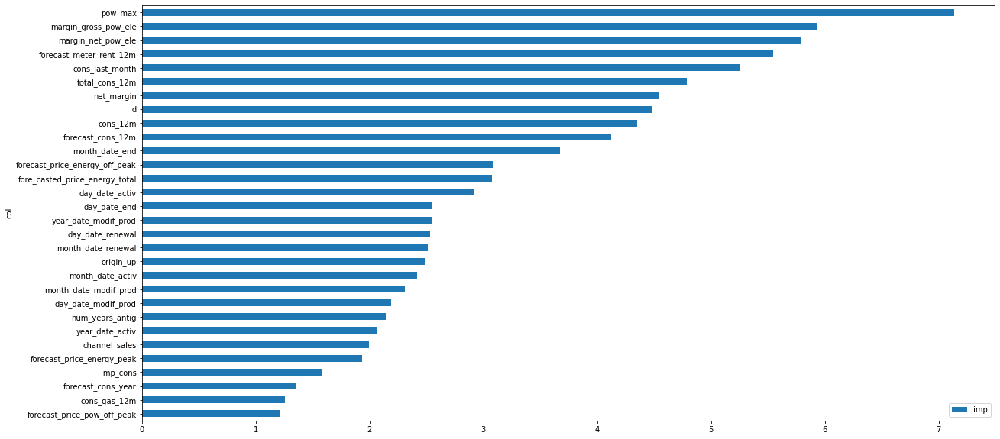

In [272]:
# Feature Importances : the importance of the feauture that contributed to the learning of our model sroted from most important to least important

def feature_importance(model, data):
    """
    Function to show which features are most important in the model.
    ::param_model:: Which model to use?
    ::param_data:: What data to use?
    """
    fea_imp = pd.DataFrame({'imp': model.feature_importances_, 'col': data.columns})
    fea_imp = fea_imp.sort_values(['imp', 'col'], ascending=[True, False]).iloc[-30:]
    _= fea_imp.plot(kind='barh', x='col', y='imp', figsize=(20, 10))
    return fea_imp


feature_importance(catboost_model, X_train)

As we can see for this model we can clearly notice that we have four features with importances under 1 comapred to most of the features ranging between 3 and 7.5

In [273]:
# X_train.drop(columns=["has_gas","nb_prod_act","num_years_antig","forecast_discount_energy"], inplace=True)

In [274]:
# X_test.drop(columns=["has_gas","nb_prod_act","num_years_antig","forecast_discount_energy"], inplace=True)

## Modelling

<div class="alert alert-block alert-success">
Now let’s evaluate how well this trained model is able to predict the values of the test dataset.
We are going to use 3 metrics to evaluate performance:<br>
• Accuracy = the ratio of correctly predicted observations to the total observations<br>
• Precision = the ability of the classifier to not label a negative sample as positive<br>
• Recall = the ability of the classifier to find all the positive samples<br>
• F1-score: a way of combining the precision and recall of the model, and it is defined as the harmonic mean of the model’s precision and recall. <br>
• AUC : the measure of the ability of the classifier to distinguish between classes and is used as a summary of the ROC curve. The higher the AUC, the better the performance of the model at distinguishing between the positive and negative classes.
</div>

Let's begin by training our Catboost model and testing it on the test dataset and see how well it performs

In [275]:
train_pool = Pool(X_train,y_train)

# CatBoost model definition
catboost_model = CatBoostClassifier(
                                    iterations=1000,
                                    custom_loss=['Accuracy'],
                                    loss_function='CrossEntropy',depth=5
                                   )

# Fit CatBoost model
catboost_model.fit(train_pool,
                   plot=True)

# CatBoost accuracy
acc_catboost = round(catboost_model.score(X_train, y_train) * 100, 2)

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	learn: 0.6659824	total: 25.8ms	remaining: 25.8s
1:	learn: 0.6405579	total: 34.3ms	remaining: 17.1s
2:	learn: 0.6175952	total: 42.9ms	remaining: 14.3s
3:	learn: 0.5957692	total: 50.9ms	remaining: 12.7s
4:	learn: 0.5753977	total: 58.8ms	remaining: 11.7s
5:	learn: 0.5566162	total: 66.6ms	remaining: 11s
6:	learn: 0.5390072	total: 74.3ms	remaining: 10.5s
7:	learn: 0.5232824	total: 81.9ms	remaining: 10.2s
8:	learn: 0.5078731	total: 89.8ms	remaining: 9.88s
9:	learn: 0.4942584	total: 97.5ms	remaining: 9.65s
10:	learn: 0.4817198	total: 105ms	remaining: 9.45s
11:	learn: 0.4701478	total: 113ms	remaining: 9.29s
12:	learn: 0.4589232	total: 120ms	remaining: 9.14s
13:	learn: 0.4487878	total: 128ms	remaining: 9.02s
14:	learn: 0.4394818	total: 136ms	remaining: 8.92s
15:	learn: 0.4297546	total: 144ms	remaining: 8.83s
16:	learn: 0.4214325	total: 151ms	remaining: 8.74s
17:	learn: 0.4141087	total: 159ms	remaining: 8.66s
18:	learn: 0.4072672	total: 167ms	remaining: 8.6s
19:	learn: 0.4005293	total: 174ms	

166:	learn: 0.2829258	total: 1.36s	remaining: 6.81s
167:	learn: 0.2827520	total: 1.37s	remaining: 6.8s
168:	learn: 0.2826376	total: 1.38s	remaining: 6.79s
169:	learn: 0.2825152	total: 1.39s	remaining: 6.79s
170:	learn: 0.2823954	total: 1.4s	remaining: 6.78s
171:	learn: 0.2822768	total: 1.41s	remaining: 6.76s
172:	learn: 0.2820453	total: 1.41s	remaining: 6.76s
173:	learn: 0.2819167	total: 1.42s	remaining: 6.75s
174:	learn: 0.2817064	total: 1.43s	remaining: 6.74s
175:	learn: 0.2815446	total: 1.44s	remaining: 6.74s
176:	learn: 0.2813904	total: 1.45s	remaining: 6.73s
177:	learn: 0.2812088	total: 1.46s	remaining: 6.73s
178:	learn: 0.2810681	total: 1.47s	remaining: 6.72s
179:	learn: 0.2806865	total: 1.47s	remaining: 6.71s
180:	learn: 0.2805176	total: 1.48s	remaining: 6.71s
181:	learn: 0.2804030	total: 1.49s	remaining: 6.7s
182:	learn: 0.2802564	total: 1.5s	remaining: 6.69s
183:	learn: 0.2800065	total: 1.51s	remaining: 6.68s
184:	learn: 0.2798893	total: 1.51s	remaining: 6.67s
185:	learn: 0.27

328:	learn: 0.2613447	total: 2.67s	remaining: 5.44s
329:	learn: 0.2612439	total: 2.68s	remaining: 5.44s
330:	learn: 0.2611746	total: 2.69s	remaining: 5.43s
331:	learn: 0.2610849	total: 2.69s	remaining: 5.42s
332:	learn: 0.2609968	total: 2.7s	remaining: 5.41s
333:	learn: 0.2608563	total: 2.71s	remaining: 5.4s
334:	learn: 0.2607413	total: 2.72s	remaining: 5.39s
335:	learn: 0.2605412	total: 2.73s	remaining: 5.38s
336:	learn: 0.2604597	total: 2.73s	remaining: 5.38s
337:	learn: 0.2603115	total: 2.74s	remaining: 5.37s
338:	learn: 0.2602584	total: 2.75s	remaining: 5.36s
339:	learn: 0.2601805	total: 2.76s	remaining: 5.35s
340:	learn: 0.2600239	total: 2.76s	remaining: 5.34s
341:	learn: 0.2599117	total: 2.77s	remaining: 5.33s
342:	learn: 0.2597976	total: 2.78s	remaining: 5.33s
343:	learn: 0.2596856	total: 2.79s	remaining: 5.32s
344:	learn: 0.2594723	total: 2.79s	remaining: 5.31s
345:	learn: 0.2593120	total: 2.8s	remaining: 5.3s
346:	learn: 0.2591039	total: 2.81s	remaining: 5.29s
347:	learn: 0.25

489:	learn: 0.2426078	total: 3.95s	remaining: 4.11s
490:	learn: 0.2425378	total: 3.96s	remaining: 4.1s
491:	learn: 0.2424272	total: 3.97s	remaining: 4.09s
492:	learn: 0.2423464	total: 3.97s	remaining: 4.09s
493:	learn: 0.2422399	total: 3.98s	remaining: 4.08s
494:	learn: 0.2421799	total: 4s	remaining: 4.08s
495:	learn: 0.2420730	total: 4.01s	remaining: 4.08s
496:	learn: 0.2420028	total: 4.02s	remaining: 4.07s
497:	learn: 0.2418598	total: 4.03s	remaining: 4.06s
498:	learn: 0.2417149	total: 4.03s	remaining: 4.05s
499:	learn: 0.2415966	total: 4.04s	remaining: 4.04s
500:	learn: 0.2414307	total: 4.05s	remaining: 4.03s
501:	learn: 0.2413622	total: 4.06s	remaining: 4.03s
502:	learn: 0.2412056	total: 4.07s	remaining: 4.02s
503:	learn: 0.2410850	total: 4.07s	remaining: 4.01s
504:	learn: 0.2410126	total: 4.08s	remaining: 4s
505:	learn: 0.2409193	total: 4.09s	remaining: 3.99s
506:	learn: 0.2407779	total: 4.09s	remaining: 3.98s
507:	learn: 0.2406883	total: 4.1s	remaining: 3.97s
508:	learn: 0.240614

648:	learn: 0.2276083	total: 5.27s	remaining: 2.85s
649:	learn: 0.2275155	total: 5.28s	remaining: 2.84s
650:	learn: 0.2274131	total: 5.29s	remaining: 2.83s
651:	learn: 0.2273420	total: 5.3s	remaining: 2.83s
652:	learn: 0.2272355	total: 5.3s	remaining: 2.82s
653:	learn: 0.2271202	total: 5.31s	remaining: 2.81s
654:	learn: 0.2270243	total: 5.32s	remaining: 2.8s
655:	learn: 0.2268846	total: 5.33s	remaining: 2.79s
656:	learn: 0.2267749	total: 5.34s	remaining: 2.79s
657:	learn: 0.2266967	total: 5.35s	remaining: 2.78s
658:	learn: 0.2265927	total: 5.35s	remaining: 2.77s
659:	learn: 0.2265394	total: 5.36s	remaining: 2.76s
660:	learn: 0.2264660	total: 5.37s	remaining: 2.75s
661:	learn: 0.2263446	total: 5.38s	remaining: 2.75s
662:	learn: 0.2262680	total: 5.38s	remaining: 2.74s
663:	learn: 0.2261824	total: 5.39s	remaining: 2.73s
664:	learn: 0.2261097	total: 5.4s	remaining: 2.72s
665:	learn: 0.2260224	total: 5.41s	remaining: 2.71s
666:	learn: 0.2259716	total: 5.42s	remaining: 2.7s
667:	learn: 0.225

810:	learn: 0.2145257	total: 6.6s	remaining: 1.54s
811:	learn: 0.2144414	total: 6.61s	remaining: 1.53s
812:	learn: 0.2143711	total: 6.62s	remaining: 1.52s
813:	learn: 0.2143174	total: 6.62s	remaining: 1.51s
814:	learn: 0.2142902	total: 6.63s	remaining: 1.5s
815:	learn: 0.2141837	total: 6.64s	remaining: 1.5s
816:	learn: 0.2141463	total: 6.65s	remaining: 1.49s
817:	learn: 0.2140290	total: 6.66s	remaining: 1.48s
818:	learn: 0.2139203	total: 6.67s	remaining: 1.47s
819:	learn: 0.2138581	total: 6.67s	remaining: 1.46s
820:	learn: 0.2137948	total: 6.68s	remaining: 1.46s
821:	learn: 0.2137465	total: 6.69s	remaining: 1.45s
822:	learn: 0.2136808	total: 6.7s	remaining: 1.44s
823:	learn: 0.2135773	total: 6.71s	remaining: 1.43s
824:	learn: 0.2135079	total: 6.71s	remaining: 1.42s
825:	learn: 0.2134742	total: 6.72s	remaining: 1.42s
826:	learn: 0.2133768	total: 6.73s	remaining: 1.41s
827:	learn: 0.2132408	total: 6.74s	remaining: 1.4s
828:	learn: 0.2131785	total: 6.75s	remaining: 1.39s
829:	learn: 0.213

986:	learn: 0.2023259	total: 8.08s	remaining: 106ms
987:	learn: 0.2022827	total: 8.09s	remaining: 98.2ms
988:	learn: 0.2021969	total: 8.09s	remaining: 90ms
989:	learn: 0.2020952	total: 8.1s	remaining: 81.8ms
990:	learn: 0.2020277	total: 8.11s	remaining: 73.7ms
991:	learn: 0.2019527	total: 8.12s	remaining: 65.5ms
992:	learn: 0.2018579	total: 8.13s	remaining: 57.3ms
993:	learn: 0.2018068	total: 8.13s	remaining: 49.1ms
994:	learn: 0.2017433	total: 8.14s	remaining: 40.9ms
995:	learn: 0.2016975	total: 8.15s	remaining: 32.7ms
996:	learn: 0.2016517	total: 8.16s	remaining: 24.6ms
997:	learn: 0.2015688	total: 8.17s	remaining: 16.4ms
998:	learn: 0.2014925	total: 8.17s	remaining: 8.18ms
999:	learn: 0.2014498	total: 8.18s	remaining: 0us


In [276]:
#predicting
catboost_predictions = catboost_model.predict(X_test)


In [325]:
metrics = ['Precision', 'Recall', 'F1', 'AUC','Accuracy']
eval_metrics = catboost_model.eval_metrics(train_pool,
                                           metrics=metrics,
                                           plot=True)

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

As shown in the charts of our model we have quite the impressive metrics that we will be discussing further on in our evalutation but here is an overvie for now

In [326]:
metrics_df = pd.DataFrame({'model':[],'Precision':[], 'Recall':[], 'F1':[], 'AUC':[],'Accuracy':[]})

In [330]:
catboost_metrics = {
        'Model':[],
         'Precision':[],
                  'Recall':[],
                  'F1':[], 
                  'AUC':[],
                  'Accuracy':[]
                 }
catboost_metrics['Model']= 'CatBoost'
metrics = ['Precision', 'Recall', 'F1', 'AUC','Accuracy']
for metric in metrics:
    catboost_metrics[metric].append(np.mean(eval_metrics[metric]))
    print(str(metric)+": {}".format(np.mean(eval_metrics[metric])))

Precision: 0.9604845086979267
Recall: 0.11233274647887324
F1: 0.18988474995917884
AUC: 0.8355849401675709
Accuracy: 0.9133412127440904


Now let's try building other models to see the overall performance of other models compared to our main model and for that we will be using a variety of classifiers. <br>
We will create a function that will automate the learning and the predictions of all of the models and returns a dataframe containing the evaluation metrics

In [338]:
def model(models,X_train, y_train,X_test,y_test):
    
    metrics = {'Model': ['RandomForestClassifier','XGBClassifier','lgb.LGBMClassifier','SVC','LogisticRegression','SGDClassifier'],
                  'Precision':[],
                  'Recall':[],
                  'F1':[], 
                  'AUC':[],
                  'Accuracy':[]
                 }
 
    for mod in models:
        model = mod
        model.fit(X_train, y_train)
        predictions = model.predict(X_test)  
        metrics['Precision'].append(precision_score(y_test,predictions))
        metrics['Recall'].append(recall_score(y_test, predictions))
        metrics['F1'].append(f1_score(y_test, predictions))
        metrics['AUC'].append(roc_auc_score(y_test, predictions))
        metrics['Accuracy'].append(accuracy_score(y_test, predictions))
        

    metrics = pd.DataFrame(metrics)
    return metrics
        

In [339]:
models = [RandomForestClassifier(n_estimators=1000),XGBClassifier(),lgb.LGBMClassifier(learning_rate=0.09,max_depth=-5,random_state=42),SVC(),LogisticRegression(),SGDClassifier()]

In [340]:
metrics = model(models,X_train, y_train,X_test,y_test)

In [343]:
metrics_df = metrics.append(pd.DataFrame(catboost_metrics), ignore_index=True)

In [347]:
metrics_df.sort_values(by=['Accuracy'],ascending=False)

,Model,Precision,Recall,F1,AUC,Accuracy
6,CatBoost,0.960485,0.112333,0.189885,0.835585,0.913341
2,lgb.LGBMClassifier,0.000000,0.000000,0.000000,0.500000,0.904452
3,SVC,0.000000,0.000000,0.000000,0.500000,0.904452
1,XGBClassifier,0.000000,0.000000,0.000000,0.498864,0.902397
0,RandomForestClassifier,0.101562,0.465950,0.166774,0.515254,0.555137
4,LogisticRegression,0.096712,0.537634,0.163934,0.503577,0.476027
5,SGDClassifier,0.095405,0.878136,0.172111,0.499273,0.192808


CatBoost confusion matrix

<AxesSubplot:>

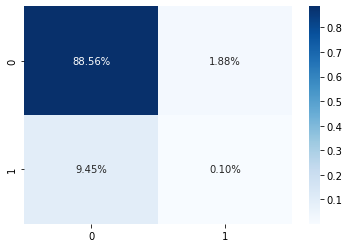

In [350]:
from sklearn.metrics import confusion_matrix
cf_matrix = confusion_matrix(y_test, catboost_predictions)
sns.heatmap(cf_matrix/np.sum(cf_matrix), annot=True, 
            fmt='.2%', cmap='Blues')

<div class="alert alert-block alert-info">
    Looking at the dataframe we can clearly notice high accuracies ranging from 0.9 to 0.91 in 5 of the classifiers with a huge fall to the last classifier with a value of 0.19. the overall accuracy we have found describes the good performace of the model yet it's not enough for a full evaluation. <br>
    We need to look also at the Precision which indicates whether classifies negative values as positive. <br> for the Light GBM ,SVM XGboost we have a 0% precision with 90% accuracy ! This is dangerous if not noticed. and this means that out of all the positive values non are predicted correctly. So they have an overall high accuracy but for the 10% of our test dataset they are predicted falsely and for this reason these models are eliminated. <br><br>
    Now looking at the <b>CatBoost</b> model we can identify a harmonic balance between the metrics with an accuracy of <b> 91%</b> and precision of <b> 96% ! </b> and this indicates clearly that our model is ROBUST when it comes to predicting the customers that are churning. Where as the limits are for the lower percentage of the non churning customers our model only predicted 10% of the correctly and for that we will be needing to go back through the cycle adjust our model and make it even better and handle our data with oversampling and undersamling techniques as well as request more data from the client and finally tuning our parameters.. as for the AUC we have a value of 83 that gives an idea about the overall accuracy of the predicted values with the area under the curve which is higher than that above the curve.<br><br>
    However we are
    For those reasons. we will be choosing the CatBoost model as the victorious among the others and the one we will use to deploy our app and give insights to the client.
</div>

## Final Verdict and Insights

<div class="alert alert-block alert-info">
    The main goal of this project is to determine whether PowerCO's strategy of giving a 20% discount or not is related to the churning of the customer. Given the insights dervied from our project the discount variable has a low effect on the customer churning. whereas their consumption of power over the previous 12 months does as well as the net margin and other factors. Henceforth giving discounts excessively will negative affect the revenues even if the company gains advantage over their competitors. Thus the final and main insights we will be discussing with the comapany are like follows : <br> 1. 20% discounts will not lead to lower percentages of churning. <br> 2. there are other factors that are highly related to predicting the churning rates and they are necessary data for our model to predict the churning of your new customers which will be given in a separate chart
</div>

## Deployment

Let's export our model in order to build a web application and give insights to our client

In [351]:
import pickle
# open a file, where you ant to store the data
file = open('cat_boost_regression_model.pkl', 'wb')

# dump information to that file
pickle.dump(catboost_model, file)

<div class="alert alert-block alert-success">
Unpublished Work © 2022 Nizar Ben Hmida<br><br>
Email : nizar.benhmida@esprit.tn <br>
LinkedIn : https://www.linkedin.com/in/nizar-ben-hmida-76480b164/
    </div>